In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 800)



In [2]:
def missing_values_analysis(df):
    na_columns_ = [col for col in df.columns if df[col].isnull().sum() > 0]
    n_miss = df[na_columns_].isnull().sum().sort_values(ascending=False)
    ratio_ = (df[na_columns_].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio_, 2)], axis=1, keys=['Total Missing Values', 'Ratio'])
    missing_df = pd.DataFrame(missing_df).sort_values(by="Ratio", ascending=False)
    return missing_df


def check_df(dataframe, head=5, tail=5):
    print("*" * 70)
    print(" Shape ".center(70, "*"))
    print("*" * 70)
    print(dataframe.shape)

    print("*" * 70)
    print(" Types ".center(70, "*"))
    print("*" * 70)
    print(dataframe.dtypes)

    print("*" * 70)
    print(" Head ".center(70, "*"))
    print("*" * 70)
    print(dataframe.head(head))

    print("*" * 70)
    print(" Tail ".center(70, "*"))
    print("*" * 70)
    print(dataframe.tail(tail))

    print("*" * 70)
    print(" NA ".center(70, "*"))
    print("*" * 70)
    print(missing_values_analysis(dataframe))

    print("*" * 70)
    print(" Quantiles ".center(70, "*"))
    print("*" * 70)
    print(dataframe.describe([.01, .05, .1, .5, .9, .95, .99]).T)

    print("*" * 70)
    print(" Duplicate Rows ".center(70, "*"))
    print("*" * 70)
    print(dataframe.duplicated().sum())

    print("*" * 70)
    print(" Uniques ".center(70, "*"))
    print("*" * 70)
    print(dataframe.nunique())

In [3]:
train = pd.read_excel("C:/Users/Furka/Downloads/train (1).xlsx", index_col=[0])
test = pd.read_excel("C:/Users/Furka/Downloads/test (1).xlsx",  index_col=[0])


In [4]:
train.head(10)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9',{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8',{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137
3,2919,{621071},{'Sünnet'},Z41.2',{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923
4,217,{619690},{'İnternal üretrotomi'},"N40', 'N35.8', 'N30.0'",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819
5,3440,"{610480, 610530}","{'Hemoroidektomi', 'Anoplasti'}",I84',"{283.0, 412.0}","{'D', 'C'}",Sedo Analjezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",44,3,36,4,FEMALE,"[225, 400]",312.5,2802
6,2423,"{603771, 614380}","{'Greftli inguinal herni onarımı, inkarsere ve...",K40.3',"{150.0, 567.0}","{'D', 'B'}",Spinal Anestezi,Pilonidal kist,42,3,5,6,FEMALE,"[225, 700]",462.5,4595
7,1295,"{614160, 615920}","{'Lomber mikrocerrahi ile diskektomi, tek sevi...",'M51.1',"{160.0, 820.0}",{ 'B'},Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,39,2,42,10,MALE,[700],700.0,7161
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9',"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019
9,3174,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9',{453.0},{'C'},Spinal Anestezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",60,3,47,11,MALE,[400],400.0,3813


In [5]:
check_df(train)

**********************************************************************
******************************* Shape ********************************
**********************************************************************
(2860, 16)
**********************************************************************
******************************* Types ********************************
**********************************************************************
ID                                 int64
AmeliyatIslemKodu                 object
AmeliyatIslemi                    object
DiagnosticICD10Code               object
AmeliyatGrubuPerformansVerisi     object
SurgeryGroup                      object
AnesthesiaType                    object
SurgeryName                       object
Age                                int64
Service                            int64
DoctorID                           int64
AnaesthetistID                     int64
Sex                               object
SurgeryGroupRisk              

### performans verisi - islem kodu- islem aynı seyi ifade ediyor veya performansa numeric diğer ikisine tek şekilde kategorik davranmak gerek

In [28]:
{621071}
train[train["AmeliyatIslemKodu"]=="{607932, 607910}"]
{'Vena safena magna ve /veya parvanın endovenöz ablasyonu RF', 'Varislerde lokal pake eksizyonu, her biri'}
{'Vena safena magna ve/veya parvanın endovenöz ablasyonu (RF/lazer/buhar)'}
{'Varislerde lokal pake eksizyonu, her biri'}

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9',"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019
27,610,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.0',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,"Alt ekstremitenin variköz venleri, enflamasyon...",51,8,8,2,FEMALE,[75],75.0,2929
30,897,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,44,8,46,12,FEMALE,[75],75.0,2950
33,797,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,25,8,25,12,MALE,[75],75.0,2109
41,3159,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,42,8,25,2,FEMALE,[75],75.0,1916
55,1931,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,64,8,46,2,FEMALE,[75],75.0,2116
62,674,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ameliyat Tanimlanmamis,54,8,46,12,MALE,[75],75.0,2105
64,968,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,50,8,46,7,FEMALE,[75],75.0,2680
70,3660,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,"E78.5', 'I25.1', 'I10', 'I83.9'","{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,41,8,25,14,FEMALE,[75],75.0,3756


In [5]:
app_train = train.copy()
app_test = test.copy()
app_train.drop_duplicates(inplace=True)
app_train.drop_duplicates(subset=["ID"], keep='first', inplace=True)
app_test.drop_duplicates(subset=["ID"], keep='first', inplace=True)

In [6]:
app_test.ID.value_counts()

1382    1
2122    1
642     1
1720    1
2581    1
       ..
3554    1
3460    1
1879    1
690     1
1064    1
Name: ID, Length: 1207, dtype: int64

In [7]:
app_train[app_train["ID"]==443]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
97,443,"{602240, 618411, 618360}","{'Endoskopik konka redüksiyonu', 'Miringotomi'...","'H65.2', 'J34.3'","{200.0, 300.0, 70.0}","{'D', 'E', 'C'}",Genel Anestezi,Kronik seröz otitis media | Konka hipertrofisi,18,1,45,5,MALE,"[225, 75, 400]",233.333333,2066


In [41]:
app_train[app_train["SurgeryGroup"].str.contains('E')]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9',"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019
17,2516,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83.9',"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,47,8,46,14,FEMALE,[75],75.0,2557
21,2209,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83.9',"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,2,MALE,[75],75.0,2679
27,610,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.0',"{50.0, 300.0}",{ 'E'},Sedo Analjezi,"Alt ekstremitenin variköz venleri, enflamasyon...",51,8,8,2,FEMALE,[75],75.0,2929
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2664,28,"{607932, 607910}","{'Varislerde lokal pake eksizyonu, her biri (A...",I83.9',"{50.0, 300.0}",{ 'E'},Genel Anestezi,Alt ekstremitenin variköz venleri,38,4,8,2,FEMALE,[75],75.0,2816
2679,29,"{607932, 607910}","{'Varislerde lokal pake eksizyonu, her biri (A...",I83.9',"{50.0, 300.0}",{ 'E'},Genel Anestezi,Alt ekstremitenin variköz venleri,75,4,8,2,FEMALE,[75],75.0,4402
2686,58,"{607932, 607910}","{'Varislerde lokal pake eksizyonu, her biri (A...",I83.9',"{50.0, 300.0}",{ 'E'},Genel Anestezi,"Alt ekstremitenin variköz venleri, enflamasyon...",40,4,8,2,MALE,[75],75.0,3797
2713,94,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9',"{50.0, 300.0}",{ 'E'},Genel Anestezi,Alt ekstremitenin variköz venleri,46,4,25,10,FEMALE,[75],75.0,2285


In [18]:
app_test.ID.value_counts()


3140    2
2471    2
302     2
3369    2
446     2
       ..
1952    1
503     1
933     1
636     1
1064    1
Name: ID, Length: 1207, dtype: int64

In [8]:
app_test[app_test["ID"]==3140]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
155,3140,"{621550, 621071}","{'İnmemiş testis cerrahisi', 'Sünnet'}","Z41.2', 'Q53.2'","{500.0, 175.0}","{'D', 'B'}",Genel Anestezi,Rutin ve dini sünnet,6,5,15,11,MALE,"[225, 700]",462.5,6883


In [9]:
app_train_clean = app_train.copy()
app_train_clean["DiagnosticICD10Code"] = app_train_clean["DiagnosticICD10Code"].str.replace("'","")
app_train_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819


In [10]:
app_test_clean = app_test.copy()
app_test_clean["DiagnosticICD10Code"] = app_test_clean["DiagnosticICD10Code"].str.replace("'","")
app_test_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335


In [11]:
import re
def extract_numbers(s):
    numbers = [int(x) for x in re.findall(r'\d+', s)]
    return numbers if numbers else [0] 

# Convert string values to lists of numbers
app_train_clean['numbers'] = app_train_clean['SurgeryGroupRisk'].apply(extract_numbers)
app_train_clean.head(10)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400]
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75]
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700]
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225]
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400]
5,3440,"{610480, 610530}","{'Hemoroidektomi', 'Anoplasti'}",I84,"{283.0, 412.0}","{'D', 'C'}",Sedo Analjezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",44,3,36,4,FEMALE,"[225, 400]",312.5,2802,"[225, 400]"
6,2423,"{603771, 614380}","{'Greftli inguinal herni onarımı, inkarsere ve...",K40.3,"{150.0, 567.0}","{'D', 'B'}",Spinal Anestezi,Pilonidal kist,42,3,5,6,FEMALE,"[225, 700]",462.5,4595,"[225, 700]"
7,1295,"{614160, 615920}","{'Lomber mikrocerrahi ile diskektomi, tek sevi...",M51.1,"{160.0, 820.0}",{ 'B'},Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,39,2,42,10,MALE,[700],700.0,7161,[700]
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9,"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019,[75]
9,3174,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Spinal Anestezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",60,3,47,11,MALE,[400],400.0,3813,[400]


In [12]:
app_train_clean["SurgeryGroup_Sum"] = app_train_clean["numbers"].apply(lambda x: np.sum(x))
app_train_clean["SurgeryGroup_Count"] = app_train_clean["numbers"].apply(lambda x: len(x))
app_train_clean["SurgeryGroup_Avg"] = app_train_clean["numbers"].apply(lambda x: np.mean(x))
app_train_clean["SurgeryGroup_Std"] = app_train_clean["numbers"].apply(lambda x: np.std(x))
app_train_clean["SurgeryGroup_Max"] = app_train_clean["numbers"].apply(lambda x: np.max(x))
app_train_clean["SurgeryGroup_Min"] = app_train_clean["numbers"].apply(lambda x: np.min(x))

In [13]:
app_train_clean.tail(10)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min
2850,1919,"{612760, 612830}","{'Artroskopik menisküs onarımı, diz', 'Artrosk...",I83.9,"{675.0, 495.0}","{'C', 'B'}",Genel Anestezi,Diğer tanımlanmış eklem bozuklukları,33,2,40,4,MALE,"[400, 700]",550.0,11830,"[400, 700]",1100,2,550.0,150.0,700,400
2851,103,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",I83.9,"{400.0, 300.0}",{'C'},Genel Anestezi,"Pilonidal kist, apsesiz",21,3,5,7,FEMALE,[400],400.0,3091,[400],400,1,400.0,0.0,400,400
2852,1027,{614390},"{'Benign yumuşak doku tümörü, kompleks'}",I83.9,{675.0},{'B'},Genel Anestezi,"Alt ekstremitenin lokalize şişme, kitle ve yum...",51,3,43,3,MALE,[700],700.0,2260,[700],700,1,700.0,0.0,700,700
2853,1237,{603843},{'Greftli epigastrik herni onarımı'},I83.9,{425.0},{'C'},Genel Anestezi,"Bilateral inguinal herni, gangrenli",42,3,47,12,FEMALE,[400],400.0,5141,[400],400,1,400.0,0.0,400,400
2854,1537,{619530},"{'Sistoskopi, tanısal'}",I83.9,{150.0},{0},Genel Anestezi,"Üriner sistem enfeksiyonu, yeri tanımlanmamış",43,5,27,12,MALE,[],0.0,2761,[0],0,1,0.0,0.0,0,0
2855,83,{603841},{'Greftli umblikal herni onarımı'},I83.9,{396.0},{'C'},Genel Anestezi,Umbilikal herni,66,3,33,2,FEMALE,[400],400.0,4881,[400],400,1,400.0,0.0,400,400
2856,1785,{611340},{'Büyük kemik implant çıkarma (Aktarim)'},I83.9,{220.0},{'D'},Genel Anestezi,Eklem ağrısı,7,2,10,13,MALE,[225],225.0,1563,[225],225,1,225.0,0.0,225,225
2857,894,{614390},"{'Benign yumuşak doku tümörü, kompleks'}",I83.9,{675.0},{'B'},Genel Anestezi,"Lokalize şişme kitle ve yumrusu, tanımlanmamış",28,9,39,4,MALE,[700],700.0,1426,[700],700,1,700.0,0.0,700,700
2858,484,{614390},"{'Benign yumuşak doku tümörü, kompleks'}",I83.9,{675.0},{'B'},Genel Anestezi,Ameliyat Tanimlanmamis,36,3,36,5,MALE,[700],700.0,1431,[700],700,1,700.0,0.0,700,700
2859,882,{614390},"{'Benign yumuşak doku tümörü, kompleks'}",I83.9,{675.0},{'B'},Genel Anestezi,Ganglion,49,2,23,3,FEMALE,[700],700.0,1926,[700],700,1,700.0,0.0,700,700


In [14]:
app_test_clean['numbers'] = app_test_clean['SurgeryGroupRisk'].apply(extract_numbers)

app_test_clean["SurgeryGroup_Sum"] = app_test_clean["numbers"].apply(lambda x: np.sum(x))
app_test_clean["SurgeryGroup_Count"] = app_test_clean["numbers"].apply(lambda x: len(x))
app_test_clean["SurgeryGroup_Avg"] = app_test_clean["numbers"].apply(lambda x: np.mean(x))
app_test_clean["SurgeryGroup_Std"] = app_test_clean["numbers"].apply(lambda x: np.std(x))
app_test_clean["SurgeryGroup_Max"] = app_test_clean["numbers"].apply(lambda x: np.max(x))
app_test_clean["SurgeryGroup_Min"] = app_test_clean["numbers"].apply(lambda x: np.min(x))


In [15]:
app_test_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546,[700],700,1,700.0,0.0,700,700
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235,[400],400,1,400.0,0.0,400,400
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645,[225],225,1,225.0,0.0,225,225
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768,[75],75,1,75.0,0.0,75,75
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335,[75],75,1,75.0,0.0,75,75


In [14]:
app_test_clean[app_test_clean["DiagnosticICD10Code"].isna()==True][:15]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min


In [16]:
def clean_diagnosis(diagnosis):
    if isinstance(diagnosis, str):
        return set(diagnosis.replace(', nan', '').replace(' nan,', '').replace('nan,', '').replace(' ', '').split(','))
    else:
        return diagnosis

app_train_clean['Diagnos_Clean'] = app_train_clean['DiagnosticICD10Code'].apply(clean_diagnosis)
app_test_clean['Diagnos_Clean'] = app_test_clean['DiagnosticICD10Code'].apply(clean_diagnosis)

In [17]:
app_train_clean.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,{K40.9}
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,{I83}
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,{K80.8}
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,{Z41.2}
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"{N35.8, N30.0, N40}"


In [57]:
train.iloc[train.AmeliyatIslemKodu.str.len().sort_values(ascending=False).index][:20]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
2405,3350,"{613890, 613870, 614160, 615920, 615930, 61602...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,'M51.1',"{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,64,11,42,2,FEMALE,"[1450, 225, 400, 700]",693.75,11197
922,441,"{613890, 616040, 613870, 614160, 615930, 61602...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'M51.8', 'M43.1', 'M48.06'","{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Ameliyat Tanimlanmamis,60,2,42,1,FEMALE,"[1450, 225, 400, 700]",693.75,9504
632,3727,"{613870, 614160, 615930, 616020, 614040, 61145...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'G59', 'F32.8', 'M51.1'","{160.0, 580.0, 1350.0, 1030.0, 1000.0, 330.0, ...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,69,11,42,12,FEMALE,"[1450, 225, 400, 700]",693.75,11862
608,2580,"{614380, 613870, 614160, 615930, 616020, 61404...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'I10', 'M51.1', 'R52.9'","{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,58,11,21,2,FEMALE,"[1450, 225, 400, 700]",693.75,19264
2220,401,"{615330, 613870, 614160, 615930, 616020, 61404...","{'Duraplasti, galeal greft ile', 'Lomber mikro...","'M51.8', 'M43.1', 'M48.06'","{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,"Spinal stenoz, lomber bölge",41,2,42,4,MALE,"[1450, 225, 400, 700]",693.75,10482
936,1908,"{615881, 613870, 614160, 615930, 616020, 61404...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,'M51.1',"{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Ameliyat Tanimlanmamis,44,2,42,11,FEMALE,"[1450, 225, 400, 700]",693.75,9783
2519,2580,"{614380, 613870, 614160, 615930, 616020, 61404...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'I10', 'M51.1', 'R52.9'","{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,58,11,21,2,FEMALE,"[1450, 225, 400, 700]",693.75,19268
235,3727,"{613870, 614160, 615930, 616020, 614040, 61145...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'G59', 'F32.8', 'M51.1'","{160.0, 580.0, 1350.0, 1030.0, 1000.0, 330.0, ...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,69,11,42,12,FEMALE,"[1450, 225, 400, 700]",693.75,11861
488,2227,"{613870, 614160, 615930, 616020, 614040, 61145...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'M48.0', 'M51.1', 'M43.1'","{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,41,2,21,13,MALE,"[1450, 225, 400, 700]",693.75,16695
2215,189,"{613870, 614160, 615930, 616020, 614040, 61145...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,'M51.9',"{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,"İntervertebral disk bozuklukları diğer, tanıml...",56,2,21,10,FEMALE,"[1450, 225, 400, 700]",693.75,13331


In [17]:
test.iloc[test.DiagnosticICD10Code.str.len().sort_values(ascending=False).index][:20]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second)
1067,3272,{619390},{'Mesane tümörü (TUR) (< 3 cm)'},"N30.0', 'J15.9', 'N40', 'M19.9', 'N32.0', 'L30...",{700.0},{'B'},Spinal Anestezi,Üretra taşı,68,5,15,2,MALE,[700],700.00,4578
1014,3272,{619390},{'Mesane tümörü (TUR) (< 3 cm)'},"N30.0', 'J15.9', 'N40', 'M19.9', 'N32.0', 'L30...",{700.0},{'B'},Spinal Anestezi,Üretra taşı,68,5,15,2,MALE,[700],700.00,4581
584,451,{618910},{'Endoskopik üreter taşı tedavisi'},"N20.0', 'N20.1', 'J15.9', 'M19.9', 'K21.9'",{800.0},{'B'},Genel Anestezi,Üreter taşı,30,5,15,9,MALE,[700],700.00,3260
689,902,"{613870, 614160, 615930, 616020, 614040, 61145...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'M43.1', 'M54.5', 'M51.1', 'M48.06'","{160.0, 580.0, 1350.0, 1030.0, 330.0, 720.0, 1...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Bel ağrısı,43,2,42,3,FEMALE,"[1450, 225, 400, 700]",693.75,8649
519,2547,"{609235, 530230}","{'Kist veya benign tümör çıkarılması, derin, 1...","'K29.1', 'K80.8', 'L30.8', 'M79.1'","{566.0, 150.0}","{'D', 'B'}",Genel Anestezi,"Kolelitiazis, diğer",50,3,29,12,FEMALE,"[225, 700]",462.50,5007
761,2547,"{609235, 530230}","{'Kist veya benign tümör çıkarılması, derin, 1...","'K29.1', 'K80.8', 'L30.8', 'M79.1'","{566.0, 150.0}","{'D', 'B'}",Genel Anestezi,"Kolelitiazis, diğer",50,3,29,12,FEMALE,"[225, 700]",462.50,5006
1105,3358,"{616040, 613770, 613870, 614160, 615930, 61602...",{'Lomber mikrocerrahi ile iki taraflı diskekt...,"'M43.1', 'I10', 'M51.1', 'M48.06'","{160.0, 1350.0, 1030.0, 330.0, 720.0, 1010.0, ...","{ 'Z', 'D', 'C', 'B'}",Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,70,11,42,2,FEMALE,"[1450, 225, 400, 700]",693.75,9632
676,237,{619410},{'Mesane tümörü (TUR) biyopsisi'},"K59.1', 'N30.0', 'K21.9', 'N32.9'",{400.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,67,5,15,2,FEMALE,[400],400.00,3995
1075,675,{620250},{'Kondilom koterizasyonu'},"M19.9', 'K21.9', 'A63.0', 'J15.9'",{235.0},{0},Sedo Analjezi,Ameliyat Tanimlanmamis,51,5,15,14,MALE,[],0.00,1653
36,294,"{618960, 618910}","{'Endoskopik üreter taşı tedavisi', 'Üreteral ...","N30.0', 'N20.1', 'K21.9', 'M19.9'","{800.0, 150.0}","{'D', 'B'}",Genel Anestezi,Üreter taşı,50,5,15,4,MALE,"[225, 700]",462.50,5926


In [18]:
app_train_clean[app_train_clean["ID"]==247]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
536,247,{619410},{'Mesane tümörü (TUR) biyopsisi'},"J15.9, R31, I10, K21.9, M19.9, N30.0",{400.0},{'C'},Spinal Anestezi,Ameliyat Tanimlanmamis,71,5,15,2,MALE,[400],400.0,5415,[400],400,1,400.0,0.0,400,400,"{K21.9, N30.0, I10, J15.9, M19.9, R31}"


In [19]:
app_test_clean[app_test_clean["ID"]==3272]


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
1014,3272,{619390},{'Mesane tümörü (TUR) (< 3 cm)'},"N30.0, J15.9, N40, M19.9, N32.0, L30.3, N21.1,...",{700.0},{'B'},Spinal Anestezi,Üretra taşı,68,5,15,2,MALE,[700],700.0,4581,[700],700,1,700.0,0.0,700,700,"{N32.0, N30.0, K21.9, N40, J15.9, N30.9, N21.1..."


In [20]:
app_train_clean.loc[536, "Diagnos_Clean"] = np.nan
app_test_clean.loc[1014, "Diagnos_Clean"] = np.nan


In [21]:
app_train_clean["Diagnos_Clean"] = app_train_clean["Diagnos_Clean"].fillna('')
app_train_clean['Diagnos_Clean'] = app_train_clean['Diagnos_Clean'].apply(lambda x: sorted(x, key=lambda d: d[0]))

In [22]:
app_test_clean["Diagnos_Clean"] = app_test_clean["Diagnos_Clean"].fillna('')
app_test_clean['Diagnos_Clean'] = app_test_clean['Diagnos_Clean'].apply(lambda x: sorted(x, key=lambda d: d[0]))

In [23]:
app_train_clean.head(20)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,[K40.9]
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,[I83]
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,[K80.8]
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,[Z41.2]
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"[N35.8, N30.0, N40]"
5,3440,"{610480, 610530}","{'Hemoroidektomi', 'Anoplasti'}",I84,"{283.0, 412.0}","{'D', 'C'}",Sedo Analjezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",44,3,36,4,FEMALE,"[225, 400]",312.5,2802,"[225, 400]",625,2,312.5,87.5,400,225,[I84]
6,2423,"{603771, 614380}","{'Greftli inguinal herni onarımı, inkarsere ve...",K40.3,"{150.0, 567.0}","{'D', 'B'}",Spinal Anestezi,Pilonidal kist,42,3,5,6,FEMALE,"[225, 700]",462.5,4595,"[225, 700]",925,2,462.5,237.5,700,225,[K40.3]
7,1295,"{614160, 615920}","{'Lomber mikrocerrahi ile diskektomi, tek sevi...",M51.1,"{160.0, 820.0}",{ 'B'},Genel Anestezi,Lumbar ve diğer intervertebral disk bozuklukla...,39,2,42,10,MALE,[700],700.0,7161,[700],700,1,700.0,0.0,700,700,[M51.1]
8,3300,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83.9,"{50.0, 300.0}",{ 'E'},Lokal Anestezi,Ülser veya enflamasyon olmadan alt ekstremiten...,49,8,25,4,FEMALE,[75],75.0,2019,[75],75,1,75.0,0.0,75,75,[I83.9]
9,3174,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Spinal Anestezi,"Bilateral inguinal herni, obstrüksiyonsuz veya...",60,3,47,11,MALE,[400],400.0,3813,[400],400,1,400.0,0.0,400,400,[K40.9]


In [28]:
x = app_train_clean.copy()
x.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,[K40.9]
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,[I83]
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,[K80.8]
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,[Z41.2]
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"[N40, N35.8, N30.0]"


In [24]:
from tqdm import tqdm
from tqdm.notebook import tqdm
tqdm.pandas()
import itertools


# function to generate all possible combinations with first characters for a set of diagnoses
def generate_combinations_first_char(diagnoses):
    diagnoses = [d for d in diagnoses if pd.notna(d)]
    first_chars = [diag[0] for diag in diagnoses]
    combinations = []
    for i in range(1, len(diagnoses)+1):
        for combo in itertools.combinations(first_chars, i):
            combinations.append('-'.join(combo))
    return combinations

# function to generate all possible combinations with all characters for a set of diagnoses
def generate_combinations_all_char(diagnoses):
    diagnoses = [d for d in diagnoses if pd.notna(d)]
    first_chars = [diag for diag in diagnoses]
    combinations = []
    for i in range(1, len(diagnoses)+1):
        for combo in itertools.combinations(first_chars, i):
            combinations.append('-'.join(combo))
    return combinations

# generate all combinations for each patient and add them as new columns to the DataFrame
for i, row in tqdm(app_train_clean.iterrows(), total=len(app_train_clean)):
    combos = generate_combinations_first_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_first_{j+1}'
        app_train_clean.at[i, col_name] = combo

for i, row in tqdm(app_train_clean.iterrows(), total=len(app_train_clean)):
    combos = generate_combinations_all_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_all_{j+1}'
        app_train_clean.at[i, col_name] = combo

app_train_clean.head()

  0%|          | 0/2706 [00:00<?, ?it/s]

  0%|          | 0/2706 [00:00<?, ?it/s]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,[K40.9],K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K40.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,[K80.8],K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K80.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"[N35.8, N30.0, N40]",N,N,N,N-N,N-N,N-N,N-N-N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N35.8,N30.0,N40,N35.8-N30.0,N35.8-N40,N30.0-N40,N35.8-N30.0-N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
for i, row in tqdm(app_test_clean.iterrows(), total=len(app_test_clean)):
    combos = generate_combinations_first_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_first_{j+1}'
        app_test_clean.at[i, col_name] = combo

for i, row in tqdm(app_test_clean.iterrows(), total=len(app_test_clean)):
    combos = generate_combinations_all_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_all_{j+1}'
        app_test_clean.at[i, col_name] = combo

app_test_clean.head()

  0%|          | 0/1207 [00:00<?, ?it/s]

  0%|          | 0/1207 [00:00<?, ?it/s]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546,[700],700,1,700.0,0.0,700,700,[N40],N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235,[400],400,1,400.0,0.0,400,400,[L05.0],L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768,[75],75,1,75.0,0.0,75,75,[I83.9],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
app_train_encode = app_train_clean.copy()
app_test_encode = app_test_clean.copy()


In [27]:
app_train_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,3471,{603781},"{'Greftli inguinal herni onarımı, tek taraf'}",K40.9,{453.0},{'C'},Genel Anestezi,Ameliyat Tanimlanmamis,47,3,36,2,MALE,[400],400.0,4610,[400],400,1,400.0,0.0,400,400,[K40.9],K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K40.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1564,"{607932, 607910}",{'Vena safena magna ve /veya parvanın endovenö...,I83,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Alt ekstremitenin variköz venleri,35,8,46,12,FEMALE,[75],75.0,3214,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2466,{609235},"{'Kolesistektomi, laparoskopik'}",K80.8,{566.0},{'B'},Genel Anestezi,"Kolelitiazis, diğer",34,3,47,11,FEMALE,[700],700.0,3137,[700],700,1,700.0,0.0,700,700,[K80.8],K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K80.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2919,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Rutin ve dini sünnet,8,5,15,12,MALE,[225],225.0,1923,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,217,{619690},{'İnternal üretrotomi'},"N40, N35.8, N30.0",{400.0},{'C'},Spinal Anestezi,Akut sistit,59,5,31,4,MALE,[400],400.0,2819,[400],400,1,400.0,0.0,400,400,"[N35.8, N30.0, N40]",N,N,N,N-N,N-N,N-N,N-N-N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N35.8,N30.0,N40,N35.8-N30.0,N35.8-N40,N30.0-N40,N35.8-N30.0-N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
app_train_encode['Age_Range'] = pd.cut(app_train_encode['Age'], bins=[0, 18, 45, 65, 102], labels=['child', 'young', 'mid', 'old'])
app_test_encode['Age_Range'] = pd.cut(app_test_encode['Age'], bins=[0, 18, 45, 65, 102], labels=['child', 'young', 'mid', 'old'])


In [29]:
app_test_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Service,DoctorID,AnaesthetistID,Sex,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31,Age_Range
0,1382,{621390},"{'Prostatektomi, unipolar TUR'}",N40,{800.0},{'B'},Spinal Anestezi,Benign prostat hiperplazisi,59,5,26,3,MALE,[700],700.0,2546,[700],700,1,700.0,0.0,700,700,[N40],N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid
1,837,"{610625, 600550}","{'Pilonidal sinüs eksizyonu', 'Fasiyokütan flep'}",L05.0,"{400.0, 300.0}",{'C'},Spinal Anestezi,Pilonidal kist,21,3,33,13,MALE,[400],400.0,3235,[400],400,1,400.0,0.0,400,400,[L05.0],L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
2,513,{621071},{'Sünnet'},Z41.2,{175.0},{'D'},Sedo Analjezi,Ameliyat Tanimlanmamis,6,5,15,9,MALE,[225],225.0,1645,[225],225,1,225.0,0.0,225,225,[Z41.2],Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Z41.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,child
3,2696,"{607932, 607910}",{'Vena safena magna ve/veya parvanın endovenöz...,I83.9,"{50.0, 300.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,59,8,25,4,MALE,[75],75.0,2768,[75],75,1,75.0,0.0,75,75,[I83.9],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid
4,1992,"{802756, 607910}",{'Periferik damar embolizasyonu (vena safenama...,I83,"{50.0, 100.0}",{ 'E'},Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,51,8,25,11,FEMALE,[75],75.0,1335,[75],75,1,75.0,0.0,75,75,[I83],I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid


In [30]:
train_ohe_cols = list(app_train_encode.columns[6:7]) + list(app_train_encode.columns[9:13]) + list(app_train_encode.columns[24:])
test_ohe_cols = list(app_test_encode.columns[6:7]) + list(app_test_encode.columns[9:13]) + list(app_test_encode.columns[24:])


In [31]:
set(train_ohe_cols) - set(test_ohe_cols)

set()

In [32]:
train_ohe_cols

['AnesthesiaType',
 'Service',
 'DoctorID',
 'AnaesthetistID',
 'Sex',
 'combination_first_1',
 'combination_first_2',
 'combination_first_3',
 'combination_first_4',
 'combination_first_5',
 'combination_first_6',
 'combination_first_7',
 'combination_first_8',
 'combination_first_9',
 'combination_first_10',
 'combination_first_11',
 'combination_first_12',
 'combination_first_13',
 'combination_first_14',
 'combination_first_15',
 'combination_first_16',
 'combination_first_17',
 'combination_first_18',
 'combination_first_19',
 'combination_first_20',
 'combination_first_21',
 'combination_first_22',
 'combination_first_23',
 'combination_first_24',
 'combination_first_25',
 'combination_first_26',
 'combination_first_27',
 'combination_first_28',
 'combination_first_29',
 'combination_first_30',
 'combination_first_31',
 'combination_all_1',
 'combination_all_2',
 'combination_all_3',
 'combination_all_4',
 'combination_all_5',
 'combination_all_6',
 'combination_all_7',
 'combina

In [33]:
app_train_encode = pd.get_dummies(app_train_encode, columns=train_ohe_cols)
app_test_encode = pd.get_dummies(app_test_encode, columns=test_ohe_cols)

In [34]:
app_train_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_Q,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_

In [35]:
app_test_encode.head()


,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Seçilmemiş,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_6,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_7,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_38,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_O,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_C-K,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_L-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-M,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combina

In [92]:
type(train["AmeliyatIslemKodu"][0])

str

In [93]:
unique_values = set()
for value_list in app_train_encode['AmeliyatIslemKodu']:
    values = map(str.strip, value_list.strip('{}').split(','))
    unique_values.update(values)

# Create one-hot encoded columns
for value in unique_values:
    column_name = f'AmeliyatIslemKodu_{value.replace(".", "_").replace("-", "_")}'  # Replace . and - with _
    app_train_encode[column_name] = app_train_encode['AmeliyatIslemKodu'].apply(lambda x: 1 if value in x else 0)


c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  if __name__ == '__main__':


In [94]:
app_train_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_Q,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_

In [97]:
app_train_encode[app_train_encode["AmeliyatIslemKodu_'P616_350'"]==1]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_Q,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_

In [98]:
unique_values = set()
for value_list in app_test_encode['AmeliyatIslemKodu']:
    values = map(str.strip, value_list.strip('{}').split(','))
    unique_values.update(values)

# Create one-hot encoded columns
for value in unique_values:
    column_name = f'AmeliyatIslemKodu_{value.replace(".", "_").replace("-", "_")}'  # Replace . and - with _
    app_test_encode[column_name] = app_test_encode['AmeliyatIslemKodu'].apply(lambda x: 1 if value in x else 0)


c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  if __name__ == '__main__':


In [99]:
app_test_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Seçilmemiş,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_6,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_7,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_38,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_O,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_C-K,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_L-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-M,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combina

In [114]:
app_train_encode[app_train_encode["numbers2"].str.len()==0]

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_Q,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_

In [115]:
app_train_encode['numbers2'] = app_train_encode['AmeliyatGrubuPerformansVerisi'].apply(lambda x: [float(num) if num != 'nan' else 0 for num in re.findall(r'[\d.]+|nan', x)])

In [116]:
app_train_encode["AmeliyatGrubuPerformansVerisi_Sum"] = app_train_encode["numbers2"].apply(lambda x: np.sum(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Count"] = app_train_encode["numbers2"].apply(lambda x: len(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Avg"] = app_train_encode["numbers2"].apply(lambda x: np.mean(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Std"] = app_train_encode["numbers2"].apply(lambda x: np.std(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Max"] = app_train_encode["numbers2"].apply(lambda x: np.max(x))
app_train_encode["AmeliyatGrubuPerformansVerisi_Min"] = app_train_encode["numbers2"].apply(lambda x: np.min(x))

In [117]:
app_train_encode.head(20)

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_Q,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_

In [118]:
app_test_encode['numbers2'] = app_test_encode['AmeliyatGrubuPerformansVerisi'].apply(lambda x: [float(num) if num != 'nan' else 0 for num in re.findall(r'[\d.]+|nan', x)])

c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  """Entry point for launching an IPython kernel.


In [119]:
app_test_encode["AmeliyatGrubuPerformansVerisi_Sum"] = app_test_encode["numbers2"].apply(lambda x: np.sum(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Count"] = app_test_encode["numbers2"].apply(lambda x: len(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Avg"] = app_test_encode["numbers2"].apply(lambda x: np.mean(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Std"] = app_test_encode["numbers2"].apply(lambda x: np.std(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Max"] = app_test_encode["numbers2"].apply(lambda x: np.max(x))
app_test_encode["AmeliyatGrubuPerformansVerisi_Min"] = app_test_encode["numbers2"].apply(lambda x: np.min(x))

c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  """Entry point for launching an IPython kernel.
c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  
c:\Users\Furka\anaconda3\lib\site-packages\ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once usi

In [120]:
app_test_encode.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Seçilmemiş,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_6,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_7,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_38,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_O,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_C-K,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_L-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-M,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combina

In [121]:
z = app_train_encode.copy()

In [122]:
t = app_test_encode.copy()

In [123]:
z.shape

(2706, 1959)

In [124]:
t.shape

(1207, 1266)

In [125]:
z, t = z.align(t, join = 'inner', axis = 1)

In [126]:
z.shape

(2706, 1161)

In [127]:
t.shape

(1207, 1161)

In [132]:
train.shape

(2860, 16)

In [133]:
test.shape

(1228, 16)

In [134]:
z.to_csv("academy_new_data_train_all_set_but_surgeryname.csv", index=False)


In [135]:
t.to_csv("academy_new_data_test_all_set_but_surgeryname.csv", index=False)


In [136]:
z.to_excel("academy_new_data_train_all_set_but_surgeryname.xlsx", index=False)


In [137]:
t.to_excel("academy_new_data_test_all_set_but_surgeryname.xlsx", index=False)


## Read file and continue

In [2]:
train_model = pd.read_csv("./academy_new_data_train_all_set_but_surgeryname.csv")

In [4]:
train_model.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,comb

In [3]:
test_model = pd.read_csv("./academy_new_data_test_all_set_but_surgeryname.csv")


In [6]:
test_model.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,comb

In [4]:
train_target = train_model["ElapsedTime(second)"]
test_target = test_model["ElapsedTime(second)"]

In [7]:
train_model.head()

,ID,AmeliyatIslemKodu,AmeliyatIslemi,DiagnosticICD10Code,AmeliyatGrubuPerformansVerisi,SurgeryGroup,SurgeryName,Age,SurgeryGroupRisk,SurgeryGroupRiskMean,ElapsedTime(second),numbers,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,Diagnos_Clean,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_FEMALE,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,comb

In [5]:
train_model.drop(columns=["ID", "AmeliyatIslemKodu", "AmeliyatIslemi", "DiagnosticICD10Code", "AmeliyatGrubuPerformansVerisi", "SurgeryGroup", "SurgeryGroupRisk", "SurgeryGroupRiskMean", "numbers", "Diagnos_Clean", "Sex_FEMALE", "numbers2"], inplace = True)
test_model.drop(columns=["ID", "AmeliyatIslemKodu", "AmeliyatIslemi", "DiagnosticICD10Code", "AmeliyatGrubuPerformansVerisi", "SurgeryGroup", "SurgeryGroupRisk", "SurgeryGroupRiskMean", "numbers", "Diagnos_Clean", "Sex_FEMALE", "numbers2"], inplace = True)

In [6]:
train_model.head(1)

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [7]:
test_model.head(1)


,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [12]:
train_model.dtypes[:20]

SurgeryName                                         object
Age                                                  int64
ElapsedTime(second)                                  int64
SurgeryGroup_Sum                                     int64
SurgeryGroup_Count                                   int64
SurgeryGroup_Avg                                   float64
SurgeryGroup_Std                                   float64
SurgeryGroup_Max                                     int64
SurgeryGroup_Min                                     int64
AnesthesiaType_Epidural Anestezi                     int64
AnesthesiaType_Epidural ve Genel Anestezi            int64
AnesthesiaType_Genel Anestezi                        int64
AnesthesiaType_Kombine Spinal Epidural Anestezi      int64
AnesthesiaType_Lokal Anestezi                        int64
AnesthesiaType_Periferik Bloklar                     int64
AnesthesiaType_Rejyonel Sinir Bloğu                  int64
AnesthesiaType_Sedo Analjezi                         int

## SurgeryName One-Hot

In [14]:
train_model_one_hot = pd.get_dummies(train_model, columns=["SurgeryName"])
test_model_one_hot = pd.get_dummies(test_model, columns=["SurgeryName"])

In [15]:
train_model_one_hot.head(1)

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [16]:
test_model_one_hot.head(1)


,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [17]:
train_model_one_hot, test_model_one_hot = train_model_one_hot.align(test_model_one_hot, join = 'inner', axis = 1)

In [18]:
train_model_one_hot.shape

(2706, 1295)

In [19]:
test_model_one_hot.shape


(1207, 1295)

In [21]:
train_target.shape

(2706,)

In [22]:
test_target.shape

(1207,)

In [43]:
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import re


regex = re.compile(r"\[|\]|<", re.IGNORECASE)
y = train_model_one_hot["ElapsedTime(second)"]
X = train_model_one_hot.drop(columns=["ElapsedTime(second)", "AmeliyatGrubuPerformansVerisi_Count", "SurgeryGroup_Count"])
X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

mse_errs = []
rmse_errs = []
mae_errs = []
r2_errs = []

models = []

kf = KFold(n_splits=10, shuffle=True, random_state= 42)

for split_train, split_val in list(kf.split(X)):
    
    split_train = X.index[split_train]
    split_val = X.index[split_val]
    
    X_train, y_train = X.loc[split_train], y.loc[split_train]
    X_val, y_val = X.loc[split_val], y.loc[split_val]
    print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
    

    model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
    
    preds = model.predict(X_val)
    
    rmse_err = mean_squared_error(y_val, preds, squared=False)
    print("Fold RMSE: ", rmse_err)
    rmse_errs.append(rmse_err)

    mse_err = mean_squared_error(y_val, preds)
    print("Fold MSE: ", mse_err)
    mse_errs.append(mse_err)

    mae_err = mean_absolute_error(y_val, preds)
    print("Fold MAE: ", mae_err)
    mae_errs.append(mae_err)

    r2_err = r2_score(y_val, preds)
    print("Fold R2: ", r2_err)
    r2_errs.append(r2_err)

    models.append(model)
    
    print("\n", "*"*70, "\n")

import plotly.express as px
importance = [model.feature_importances_ for model in models]

f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                        pd.Series(np.mean(importance,axis=0),name="Importance")],
                        axis=1).sort_values(by='Importance',
                                            ascending=True)

fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
fig.update_layout(
    title_text="First 20 Important Features - XGB Average of Folds"
)
fig.show()

Train shape: (2435, 1292) | Val Shape: (271, 1292)
[0]	validation_0-rmse:4317.98942	validation_1-rmse:3974.09870
[1]	validation_0-rmse:3360.08631	validation_1-rmse:3019.69490


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2760.13513	validation_1-rmse:2376.28302
[3]	validation_0-rmse:2381.80759	validation_1-rmse:1973.56141
[4]	validation_0-rmse:2149.67848	validation_1-rmse:1704.88727
[5]	validation_0-rmse:2024.29771	validation_1-rmse:1534.46202
[6]	validation_0-rmse:1941.34065	validation_1-rmse:1427.47493
[7]	validation_0-rmse:1893.71456	validation_1-rmse:1365.22809
[8]	validation_0-rmse:1871.81855	validation_1-rmse:1322.95404
[9]	validation_0-rmse:1839.01972	validation_1-rmse:1290.88531
[10]	validation_0-rmse:1834.58281	validation_1-rmse:1273.79909
[11]	validation_0-rmse:1826.32197	validation_1-rmse:1257.10016
[12]	validation_0-rmse:1812.58186	validation_1-rmse:1235.06814
[13]	validation_0-rmse:1805.55245	validation_1-rmse:1225.59403
[14]	validation_0-rmse:1805.02202	validation_1-rmse:1218.07994
[15]	validation_0-rmse:1804.48525	validation_1-rmse:1211.65475
[16]	validation_0-rmse:1802.94872	validation_1-rmse:1195.75140
[17]	validation_0-rmse:1802.30064	validation_1-rmse:1190.23821


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2745.17651	validation_1-rmse:2370.43174
[3]	validation_0-rmse:2442.34976	validation_1-rmse:1960.04503
[4]	validation_0-rmse:2245.28806	validation_1-rmse:1692.05624
[5]	validation_0-rmse:2148.23233	validation_1-rmse:1528.91179
[6]	validation_0-rmse:2080.58197	validation_1-rmse:1427.86174
[7]	validation_0-rmse:2038.43931	validation_1-rmse:1350.07634
[8]	validation_0-rmse:2022.20707	validation_1-rmse:1299.73592
[9]	validation_0-rmse:2022.02703	validation_1-rmse:1268.07448
[10]	validation_0-rmse:2019.11850	validation_1-rmse:1237.04984
[11]	validation_0-rmse:2016.65649	validation_1-rmse:1215.57855
[12]	validation_0-rmse:2017.74783	validation_1-rmse:1200.93281
[13]	validation_0-rmse:2016.78019	validation_1-rmse:1192.46273
[14]	validation_0-rmse:2013.66670	validation_1-rmse:1180.33167
[15]	validation_0-rmse:2013.40392	validation_1-rmse:1173.87274
[16]	validation_0-rmse:2012.78508	validation_1-rmse:1166.58769
[17]	validation_0-rmse:2018.08732	validation_1-rmse:1152.88379


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3118.67549	validation_1-rmse:3070.33635
[2]	validation_0-rmse:2494.91096	validation_1-rmse:2431.45362
[3]	validation_0-rmse:2105.13159	validation_1-rmse:2016.12216
[4]	validation_0-rmse:1856.60781	validation_1-rmse:1761.17981
[5]	validation_0-rmse:1700.12885	validation_1-rmse:1590.00977
[6]	validation_0-rmse:1609.74051	validation_1-rmse:1494.44827
[7]	validation_0-rmse:1553.14968	validation_1-rmse:1417.74084
[8]	validation_0-rmse:1518.36425	validation_1-rmse:1365.20078
[9]	validation_0-rmse:1490.75620	validation_1-rmse:1336.77757
[10]	validation_0-rmse:1456.41154	validation_1-rmse:1304.95570
[11]	validation_0-rmse:1454.45636	validation_1-rmse:1282.88225
[12]	validation_0-rmse:1450.91663	validation_1-rmse:1265.21910
[13]	validation_0-rmse:1449.84883	validation_1-rmse:1242.22273
[14]	validation_0-rmse:1444.34213	validation_1-rmse:1231.98471
[15]	validation_0-rmse:1446.94619	validation_1-rmse:1223.22444
[16]	validation_0-rmse:1439.40452	validation_1-rmse:1215.61268
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2459.42569	validation_1-rmse:2426.03229
[3]	validation_0-rmse:2012.91440	validation_1-rmse:2009.92715
[4]	validation_0-rmse:1737.56294	validation_1-rmse:1749.76926
[5]	validation_0-rmse:1646.76433	validation_1-rmse:1587.27263
[6]	validation_0-rmse:1582.99454	validation_1-rmse:1486.01650
[7]	validation_0-rmse:1545.74752	validation_1-rmse:1412.08259
[8]	validation_0-rmse:1538.06673	validation_1-rmse:1358.83691
[9]	validation_0-rmse:1532.00985	validation_1-rmse:1321.53771
[10]	validation_0-rmse:1530.61613	validation_1-rmse:1303.48949
[11]	validation_0-rmse:1522.82120	validation_1-rmse:1283.24491
[12]	validation_0-rmse:1518.39181	validation_1-rmse:1269.18791
[13]	validation_0-rmse:1512.97970	validation_1-rmse:1258.74322
[14]	validation_0-rmse:1509.75139	validation_1-rmse:1240.01314
[15]	validation_0-rmse:1501.84163	validation_1-rmse:1225.04415
[16]	validation_0-rmse:1502.27486	validation_1-rmse:1218.72696
[17]	validation_0-rmse:1505.67242	validation_1-rmse:1212.16875


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:2964.56997	validation_1-rmse:3071.61788
[2]	validation_0-rmse:2377.58152	validation_1-rmse:2412.06522
[3]	validation_0-rmse:2040.73794	validation_1-rmse:2006.88482
[4]	validation_0-rmse:1823.03292	validation_1-rmse:1737.03732
[5]	validation_0-rmse:1671.64181	validation_1-rmse:1562.39297
[6]	validation_0-rmse:1620.41229	validation_1-rmse:1463.98146
[7]	validation_0-rmse:1577.49253	validation_1-rmse:1385.87049
[8]	validation_0-rmse:1556.28287	validation_1-rmse:1327.70358
[9]	validation_0-rmse:1517.24057	validation_1-rmse:1295.92224
[10]	validation_0-rmse:1502.79375	validation_1-rmse:1277.32734
[11]	validation_0-rmse:1500.99188	validation_1-rmse:1267.65142
[12]	validation_0-rmse:1497.31134	validation_1-rmse:1250.47709
[13]	validation_0-rmse:1498.35848	validation_1-rmse:1222.09110
[14]	validation_0-rmse:1498.32353	validation_1-rmse:1203.27509
[15]	validation_0-rmse:1488.46058	validation_1-rmse:1184.42431
[16]	validation_0-rmse:1489.28782	validation_1-rmse:1175.12672
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:3816.56745	validation_1-rmse:4031.52439
[1]	validation_0-rmse:2907.66869	validation_1-rmse:3076.18170
[2]	validation_0-rmse:2328.16679	validation_1-rmse:2430.11815
[3]	validation_0-rmse:1995.41560	validation_1-rmse:2019.37119
[4]	validation_0-rmse:1780.18661	validation_1-rmse:1743.34635
[5]	validation_0-rmse:1664.22034	validation_1-rmse:1570.59985
[6]	validation_0-rmse:1599.56394	validation_1-rmse:1474.68781
[7]	validation_0-rmse:1580.95318	validation_1-rmse:1405.61637
[8]	validation_0-rmse:1557.25347	validation_1-rmse:1347.78401
[9]	validation_0-rmse:1544.36576	validation_1-rmse:1303.24884
[10]	validation_0-rmse:1543.65157	validation_1-rmse:1283.35557
[11]	validation_0-rmse:1538.97148	validation_1-rmse:1264.89408
[12]	validation_0-rmse:1541.61871	validation_1-rmse:1254.91346
[13]	validation_0-rmse:1537.68111	validation_1-rmse:1234.53173
[14]	validation_0-rmse:1535.15176	validation_1-rmse:1219.09699
[15]	validation_0-rmse:1534.88103	validation_1-rmse:1211.17374
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3345.04564	validation_1-rmse:3005.46800
[2]	validation_0-rmse:2738.72870	validation_1-rmse:2375.31835
[3]	validation_0-rmse:2347.47611	validation_1-rmse:1973.03216
[4]	validation_0-rmse:2115.51770	validation_1-rmse:1704.62071
[5]	validation_0-rmse:1992.88203	validation_1-rmse:1535.25807
[6]	validation_0-rmse:1940.94552	validation_1-rmse:1440.58956
[7]	validation_0-rmse:1917.27481	validation_1-rmse:1378.94601
[8]	validation_0-rmse:1908.55223	validation_1-rmse:1326.61893
[9]	validation_0-rmse:1906.70969	validation_1-rmse:1287.61589
[10]	validation_0-rmse:1895.99219	validation_1-rmse:1255.35328
[11]	validation_0-rmse:1886.19924	validation_1-rmse:1232.61251
[12]	validation_0-rmse:1881.36586	validation_1-rmse:1211.77083
[13]	validation_0-rmse:1881.88741	validation_1-rmse:1204.81523
[14]	validation_0-rmse:1882.63152	validation_1-rmse:1197.09384
[15]	validation_0-rmse:1884.30076	validation_1-rmse:1185.79857
[16]	validation_0-rmse:1884.72384	validation_1-rmse:1179.14114
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2184.57111	validation_1-rmse:2428.38500
[3]	validation_0-rmse:1819.77686	validation_1-rmse:2026.47903
[4]	validation_0-rmse:1597.37850	validation_1-rmse:1749.54105
[5]	validation_0-rmse:1492.61884	validation_1-rmse:1582.94188
[6]	validation_0-rmse:1436.04939	validation_1-rmse:1479.65227
[7]	validation_0-rmse:1397.12021	validation_1-rmse:1396.47843
[8]	validation_0-rmse:1377.00269	validation_1-rmse:1341.29466
[9]	validation_0-rmse:1360.12669	validation_1-rmse:1305.32288
[10]	validation_0-rmse:1361.61288	validation_1-rmse:1285.77674
[11]	validation_0-rmse:1356.62384	validation_1-rmse:1270.37581
[12]	validation_0-rmse:1355.61694	validation_1-rmse:1251.07658
[13]	validation_0-rmse:1356.72974	validation_1-rmse:1242.22914
[14]	validation_0-rmse:1353.93788	validation_1-rmse:1230.75451
[15]	validation_0-rmse:1351.71041	validation_1-rmse:1223.66014
[16]	validation_0-rmse:1350.81406	validation_1-rmse:1214.92364
[17]	validation_0-rmse:1349.53103	validation_1-rmse:1204.90821


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2565.25511	validation_1-rmse:2386.42163
[3]	validation_0-rmse:2163.75843	validation_1-rmse:1968.50442
[4]	validation_0-rmse:1904.98761	validation_1-rmse:1710.97234
[5]	validation_0-rmse:1749.20743	validation_1-rmse:1552.32923
[6]	validation_0-rmse:1681.78790	validation_1-rmse:1454.44227
[7]	validation_0-rmse:1646.26626	validation_1-rmse:1380.23779
[8]	validation_0-rmse:1618.07756	validation_1-rmse:1340.38392
[9]	validation_0-rmse:1608.89123	validation_1-rmse:1292.46482
[10]	validation_0-rmse:1605.82166	validation_1-rmse:1273.32311
[11]	validation_0-rmse:1600.11556	validation_1-rmse:1255.29105
[12]	validation_0-rmse:1593.62390	validation_1-rmse:1234.22936
[13]	validation_0-rmse:1599.01701	validation_1-rmse:1213.63724
[14]	validation_0-rmse:1594.47217	validation_1-rmse:1192.30559
[15]	validation_0-rmse:1594.62729	validation_1-rmse:1183.59682
[16]	validation_0-rmse:1593.95827	validation_1-rmse:1175.74144
[17]	validation_0-rmse:1592.46695	validation_1-rmse:1166.58535


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2368.77355	validation_1-rmse:2432.11835
[3]	validation_0-rmse:2003.51461	validation_1-rmse:2001.51816
[4]	validation_0-rmse:1766.03864	validation_1-rmse:1738.61878
[5]	validation_0-rmse:1628.52543	validation_1-rmse:1565.88914
[6]	validation_0-rmse:1547.27273	validation_1-rmse:1469.77497
[7]	validation_0-rmse:1498.90716	validation_1-rmse:1407.58541
[8]	validation_0-rmse:1479.05747	validation_1-rmse:1357.09485
[9]	validation_0-rmse:1459.17443	validation_1-rmse:1318.90416
[10]	validation_0-rmse:1457.94240	validation_1-rmse:1301.15844
[11]	validation_0-rmse:1455.21925	validation_1-rmse:1290.29861
[12]	validation_0-rmse:1444.37816	validation_1-rmse:1264.52660
[13]	validation_0-rmse:1442.44447	validation_1-rmse:1243.17117
[14]	validation_0-rmse:1435.11822	validation_1-rmse:1233.20807
[15]	validation_0-rmse:1427.33166	validation_1-rmse:1225.24908
[16]	validation_0-rmse:1403.21341	validation_1-rmse:1216.47561
[17]	validation_0-rmse:1404.78475	validation_1-rmse:1209.71635


In [26]:
test_model_one_hot.head(1)

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [44]:
test_label = test_model_one_hot["ElapsedTime(second)"]
test = test_model_one_hot.drop(columns=["ElapsedTime(second)", "AmeliyatGrubuPerformansVerisi_Count", "SurgeryGroup_Count"])


In [45]:
model_preds = [model.predict(test) for model in models]
model_preds

[array([4876.3047, 3849.907 , 2103.1965, ..., 2742.3748, 7811.258 ,
        2399.6418], dtype=float32),
 array([5160.0986, 3463.4153, 2076.412 , ..., 2807.3118, 6603.015 ,
        2710.4524], dtype=float32),
 array([4859.001 , 3662.1667, 1994.294 , ..., 2766.0845, 7808.231 ,
        2975.7993], dtype=float32),
 array([5121.5327, 4013.2473, 1987.126 , ..., 2935.7605, 6611.578 ,
        2484.1143], dtype=float32),
 array([4273.04  , 3718.0803, 1975.3547, ..., 2939.1162, 7088.1045,
        2675.6638], dtype=float32),
 array([4955.301 , 3416.0425, 2090.7744, ..., 2721.1104, 6605.349 ,
        2957.2039], dtype=float32),
 array([4605.616 , 3475.5974, 2048.1587, ..., 2743.4956, 6855.684 ,
        2762.0127], dtype=float32),
 array([4759.503 , 3301.729 , 1978.7231, ..., 2669.6646, 6865.512 ,
        2221.6084], dtype=float32),
 array([4588.129 , 3548.278 , 2052.081 , ..., 2987.0688, 6819.001 ,
        2298.936 ], dtype=float32),
 array([4777.3047, 3422.2778, 1999.1075, ..., 2729.37  , 7845.03

In [46]:
test_results = np.round(np.mean(model_preds,axis=0)).astype(int)

In [47]:
test_results.shape

(1207,)

In [48]:
test_label.shape

(1207,)

In [49]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(test_label, test_results, squared=False)

r2 = r2_score(test_label, test_results)

n = len(test_label)  # Number of samples
p = 1  # Number of predictors (in this case, 1 for the target variable)
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

### With one hot surgeryname and high importance AmeliyatGrubuPerformanVerisi_Count

In [34]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1344.6959164454445
R^2: 0.8046121104426952
Adjusted R-squared: 0.8044499628165066


### With one hot surgeryname and dropped AmeliyatGrubuPerformanVerisi_Count, SurgeryGroup_Count high importance

In [42]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1327.6250500066412
R^2: 0.8095415058199968
Adjusted R-squared: 0.8093834489783537


### With one hot surgeryname and dropped AmeliyatGrubuPerformanVerisi_Count and SurgeryGroup_Count

In [50]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1325.5905841743515
R^2: 0.8101247795519565
Adjusted R-squared: 0.8099672067549042


In [51]:
y_train = train_model_one_hot["ElapsedTime(second)"]
X_train = train_model_one_hot.drop(columns=["ElapsedTime(second)"])
X_test = test_model_one_hot.drop(columns=["ElapsedTime(second)"])

In [53]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model
import xgboost as xgb
from tqdm import tqdm

SEED = 42  # Set your desired random seed

class Ensemble(object):
    def __init__(self, k, stacker, base_models):
        self.k = k
        self.stacker = stacker
        self.base_models = base_models

    def fit_predict(self, X, y, pred_matrix):
        X = np.array(X)
        y = np.array(y)
        pred_matrix = np.array(pred_matrix)

        kf = KFold(n_splits=self.k, shuffle=True, random_state=0)

        S_train = np.zeros((X.shape[0], len(self.base_models)))
        S_test = np.zeros((pred_matrix.shape[0], len(self.base_models)))

        for i, clf in tqdm(enumerate(self.base_models)):
            S_test_i = np.zeros((pred_matrix.shape[0], self.k))

            for j, (train_idx, test_idx) in enumerate(kf.split(X)):
                X_train = X[train_idx]
                y_train = y[train_idx]
                X_holdout = X[test_idx]
                
                clf.fit(X_train, y_train)
                y_pred = clf.predict(X_holdout)[:]
                S_train[test_idx, i] = y_pred
                S_test_i[:, j] = clf.predict(pred_matrix)[:]

            S_test[:, i] = S_test_i.mean(1)
            
        self.stacker.fit(S_train, y)
        y_pred = self.stacker.predict(S_test)[:]
        return S_train, y_pred, S_test
    
    def layer_pred_regression(self, num_layer, X_input, Y_input, base_models, models, pred_matrix, endmodel):
        S_train, y_pred, S_test = self.fit_predict(X_input, Y_input, pred_matrix)
        
        for index in tqdm(range(0, num_layer)):
            self.base_models = models[index]
            S_train, y_pred, S_test = self.fit_predict(S_train, Y_input, S_test)
        
        endmodel.fit(S_train, Y_input)
        y_pred = endmodel.predict(S_test)
        return y_pred

# Define your base models and stacker for regression
level1 = [
    MLPRegressor(hidden_layer_sizes=(1000, 15), random_state=SEED, max_iter=500),
    RandomForestRegressor(n_estimators=300, n_jobs=-1, random_state=SEED),
    xgb.XGBRegressor(n_estimators=40, learning_rate=0.08, gamma=0, subsample=0.75,
                      colsample_bytree=1, max_depth=7, random_state=SEED)
]
level2 = [xgb.XGBRegressor(), linear_model.LinearRegression()]

models = {0: level2}

fitter_three = Ensemble(10, xgb.XGBRegressor(), level1)

# Assume you have X_train, y_train, X_test as your input data

# Define the modified layer_pred_regression function
def layer_pred_regression(self, num_layer, X_input, Y_input, base_models, models, pred_matrix, endmodel):
    S_train, y_pred, S_test = self.fit_predict(X_input, Y_input, pred_matrix)
    
    for index in tqdm(range(0, num_layer)):
        self.base_models = models[index]
        S_train, y_pred, S_test = self.fit_predict(S_train, Y_input, S_test)
        
    endmodel.fit(S_train, Y_input)
    y_pred = endmodel.predict(S_test)
    return y_pred


In [54]:
y_stack1_fitter_three = fitter_three.layer_pred_regression(1, X_train, y_train, level1, models, X_test, xgb.XGBRegressor())


3it [48:52, 977.34s/it] 
2it [00:09,  4.84s/it]00:00<?, ?it/s]
100%|██████████| 1/1 [00:10<00:00, 10.10s/it]


In [55]:
y_stack1_fitter_three.shape

(1207,)

In [56]:
y_test = test_model_one_hot["ElapsedTime(second)"]
y_test.shape

(1207,)

In [57]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_stack1_fitter_three, squared=False)

r2 = r2_score(y_test, y_stack1_fitter_three)

n = len(y_test)  # Number of samples
p = 1  # Number of predictors (in this case, 1 for the target variable)
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

### With one hot surgeryname stacked ensemble

In [58]:
print(f"RMSE: {rmse}")
print(f"R^2: {r2}")
print(f"Adjusted R-squared: {adj_r2}")

RMSE: 1538.4389942232908
R^2: 0.7442533059349111
Adjusted R-squared: 0.7440410680145252


In [8]:
def encode_test(surgery_train):
    from sklearn.model_selection import KFold
    import xgboost as xgb
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import re


    regex = re.compile(r"\[|\]|<", re.IGNORECASE)
    y = surgery_train["ElapsedTime(second)"]
    X = surgery_train.drop(columns=["ElapsedTime(second)"])
    X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

    mse_errs = []
    rmse_errs = []
    mae_errs = []
    r2_errs = []

    models = []

    kf = KFold(n_splits=10, shuffle=True, random_state= 42)

    for split_train, split_val in list(kf.split(X)):
        
        split_train = X.index[split_train]
        split_val = X.index[split_val]
        
        X_train, y_train = X.loc[split_train], y.loc[split_train]
        X_val, y_val = X.loc[split_val], y.loc[split_val]
        print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

        model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
        

        model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
        
        preds = model.predict(X_val)
        
        rmse_err = mean_squared_error(y_val, preds, squared=False)
        print("Fold RMSE: ", rmse_err)
        rmse_errs.append(rmse_err)

        mse_err = mean_squared_error(y_val, preds)
        print("Fold MSE: ", mse_err)
        mse_errs.append(mse_err)

        mae_err = mean_absolute_error(y_val, preds)
        print("Fold MAE: ", mae_err)
        mae_errs.append(mae_err)

        r2_err = r2_score(y_val, preds)
        print("Fold R2: ", r2_err)
        r2_errs.append(r2_err)

        models.append(model)
        
        print("\n", "*"*70, "\n")

    import plotly.express as px
    importance = [model.feature_importances_ for model in models]

    f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                            pd.Series(np.mean(importance,axis=0),name="Importance")],
                            axis=1).sort_values(by='Importance',
                                                ascending=True)

    fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
    fig.update_layout(
        title_text="First 20 Important Features - XGB Average of Folds"
    )
    fig.show()
    return models

In [9]:
from sklearn.metrics import mean_squared_error, r2_score


def encode_submission(surgery_test, models):
    test_label = surgery_test["ElapsedTime(second)"]
    test = surgery_test.drop(columns=["ElapsedTime(second)"])
    
    model_preds = [model.predict(test) for model in models]
    model_preds
    
    test_results = np.round(np.mean(model_preds,axis=0)).astype(int)
    

    rmse = mean_squared_error(test_label, test_results, squared=False)

    r2 = r2_score(test_label, test_results)

    n = len(test_label)  # Number of samples
    p = 1  # Number of predictors (in this case, 1 for the target variable)
    adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))
    
    print(f"RMSE: {rmse}")
    print(f"R^2: {r2}")
    print(f"Adjusted R-squared: {adj_r2}")
    


### Catboost Encode

In [10]:
import category_encoders as ce

In [10]:
catboost_train = train_model.copy()
catboost_test = test_model.copy()

In [11]:
target_train = catboost_train['ElapsedTime(second)']
target_test = catboost_test['ElapsedTime(second)']
train_surgeries = catboost_train["SurgeryName"]
test_surgeries = catboost_test["SurgeryName"]

In [13]:
cbe_encoder = ce.cat_boost.CatBoostEncoder()
cbe_encoder.fit(train_surgeries, target_train)
surgeries_catboost_train = cbe_encoder.transform(train_surgeries)
surgeries_catboost_test = cbe_encoder.transform(test_surgeries)

In [14]:
catboost_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [15]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [16]:
catboost_train["SurgeryName"] = surgeries_catboost_train

In [17]:
catboost_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [18]:
catboost_test["SurgeryName"] = surgeries_catboost_test

In [19]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [20]:
catboost_train.shape


(2706, 1149)

In [21]:
catboost_test.shape

(1207, 1149)

In [23]:
models = encode_test(catboost_train)

Train shape: (2435, 1148) | Val Shape: (271, 1148)
[0]	validation_0-rmse:4299.84154	validation_1-rmse:3974.23715
[1]	validation_0-rmse:3370.19274	validation_1-rmse:3008.03670
[2]	validation_0-rmse:2743.66179	validation_1-rmse:2368.10356
[3]	validation_0-rmse:2418.32615	validation_1-rmse:1965.89404


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2201.29795	validation_1-rmse:1702.12703
[5]	validation_0-rmse:2027.65436	validation_1-rmse:1526.87758
[6]	validation_0-rmse:1932.05331	validation_1-rmse:1413.78514
[7]	validation_0-rmse:1861.32517	validation_1-rmse:1341.57190
[8]	validation_0-rmse:1830.23880	validation_1-rmse:1300.18890
[9]	validation_0-rmse:1788.36330	validation_1-rmse:1263.70106
[10]	validation_0-rmse:1774.29695	validation_1-rmse:1242.46943
[11]	validation_0-rmse:1772.70446	validation_1-rmse:1225.31912
[12]	validation_0-rmse:1766.15981	validation_1-rmse:1205.91640
[13]	validation_0-rmse:1758.76172	validation_1-rmse:1197.55337
[14]	validation_0-rmse:1748.25344	validation_1-rmse:1183.54738
[15]	validation_0-rmse:1749.05076	validation_1-rmse:1177.31115
[16]	validation_0-rmse:1753.68979	validation_1-rmse:1166.56429
[17]	validation_0-rmse:1751.16437	validation_1-rmse:1160.84126
[18]	validation_0-rmse:1748.36712	validation_1-rmse:1156.47779
[19]	validation_0-rmse:1747.10148	validation_1-rmse:1153.1207

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2189.29375	validation_1-rmse:1663.28793
[5]	validation_0-rmse:2123.30811	validation_1-rmse:1486.71012
[6]	validation_0-rmse:2058.46224	validation_1-rmse:1382.67612
[7]	validation_0-rmse:2027.19428	validation_1-rmse:1312.80374
[8]	validation_0-rmse:2010.50672	validation_1-rmse:1269.23768
[9]	validation_0-rmse:2010.41292	validation_1-rmse:1228.15321
[10]	validation_0-rmse:1995.33132	validation_1-rmse:1196.04870
[11]	validation_0-rmse:1991.73868	validation_1-rmse:1180.67932
[12]	validation_0-rmse:1991.87764	validation_1-rmse:1171.28633
[13]	validation_0-rmse:2013.28375	validation_1-rmse:1154.04141
[14]	validation_0-rmse:2014.67777	validation_1-rmse:1141.67172
[15]	validation_0-rmse:2009.06614	validation_1-rmse:1121.87805
[16]	validation_0-rmse:2006.70637	validation_1-rmse:1117.51740
[17]	validation_0-rmse:2005.24356	validation_1-rmse:1113.26641
[18]	validation_0-rmse:2003.80231	validation_1-rmse:1101.48678
[19]	validation_0-rmse:2002.06885	validation_1-rmse:1095.9836

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1797.42705	validation_1-rmse:1696.42591
[5]	validation_0-rmse:1658.20965	validation_1-rmse:1520.24109
[6]	validation_0-rmse:1577.94225	validation_1-rmse:1407.36583
[7]	validation_0-rmse:1531.38455	validation_1-rmse:1331.71106
[8]	validation_0-rmse:1498.29604	validation_1-rmse:1283.66675
[9]	validation_0-rmse:1474.44558	validation_1-rmse:1247.18555
[10]	validation_0-rmse:1451.95284	validation_1-rmse:1215.66554
[11]	validation_0-rmse:1448.17673	validation_1-rmse:1204.10502
[12]	validation_0-rmse:1443.30897	validation_1-rmse:1182.85677
[13]	validation_0-rmse:1435.84395	validation_1-rmse:1172.48421
[14]	validation_0-rmse:1429.66496	validation_1-rmse:1165.48426
[15]	validation_0-rmse:1429.08588	validation_1-rmse:1153.91456
[16]	validation_0-rmse:1430.23666	validation_1-rmse:1145.35473
[17]	validation_0-rmse:1427.47610	validation_1-rmse:1139.86651
[18]	validation_0-rmse:1427.03329	validation_1-rmse:1133.19702
[19]	validation_0-rmse:1427.02842	validation_1-rmse:1128.8499

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1943.93754	validation_1-rmse:1972.67562
[4]	validation_0-rmse:1675.52834	validation_1-rmse:1704.46467
[5]	validation_0-rmse:1523.94531	validation_1-rmse:1543.37405
[6]	validation_0-rmse:1440.23071	validation_1-rmse:1435.03676
[7]	validation_0-rmse:1397.36975	validation_1-rmse:1371.10178
[8]	validation_0-rmse:1383.33604	validation_1-rmse:1317.94081
[9]	validation_0-rmse:1380.72398	validation_1-rmse:1286.74010
[10]	validation_0-rmse:1384.40439	validation_1-rmse:1259.57722
[11]	validation_0-rmse:1391.37101	validation_1-rmse:1240.87716
[12]	validation_0-rmse:1396.06938	validation_1-rmse:1216.74539
[13]	validation_0-rmse:1394.54884	validation_1-rmse:1207.88660
[14]	validation_0-rmse:1397.25021	validation_1-rmse:1193.86373
[15]	validation_0-rmse:1397.39549	validation_1-rmse:1184.42600
[16]	validation_0-rmse:1408.15993	validation_1-rmse:1174.02713
[17]	validation_0-rmse:1408.26790	validation_1-rmse:1170.17987
[18]	validation_0-rmse:1408.85186	validation_1-rmse:1165.74702

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1984.30321	validation_1-rmse:1961.90498
[4]	validation_0-rmse:1764.63892	validation_1-rmse:1694.23941
[5]	validation_0-rmse:1661.46497	validation_1-rmse:1520.25100
[6]	validation_0-rmse:1602.91809	validation_1-rmse:1410.97477
[7]	validation_0-rmse:1554.67512	validation_1-rmse:1342.65371
[8]	validation_0-rmse:1529.22092	validation_1-rmse:1301.48931
[9]	validation_0-rmse:1514.40143	validation_1-rmse:1267.75777
[10]	validation_0-rmse:1499.27264	validation_1-rmse:1240.37088
[11]	validation_0-rmse:1491.97801	validation_1-rmse:1220.95969
[12]	validation_0-rmse:1495.52608	validation_1-rmse:1204.70262
[13]	validation_0-rmse:1496.10133	validation_1-rmse:1195.90671
[14]	validation_0-rmse:1499.05057	validation_1-rmse:1189.04716
[15]	validation_0-rmse:1493.12787	validation_1-rmse:1175.53826
[16]	validation_0-rmse:1493.14391	validation_1-rmse:1166.01685
[17]	validation_0-rmse:1494.68579	validation_1-rmse:1161.49157
[18]	validation_0-rmse:1493.16243	validation_1-rmse:1157.90494

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2003.95236	validation_1-rmse:1977.98502
[4]	validation_0-rmse:1773.32970	validation_1-rmse:1709.20146
[5]	validation_0-rmse:1637.89211	validation_1-rmse:1530.87355
[6]	validation_0-rmse:1539.00755	validation_1-rmse:1421.84451
[7]	validation_0-rmse:1487.66523	validation_1-rmse:1347.83213
[8]	validation_0-rmse:1443.39883	validation_1-rmse:1289.99532
[9]	validation_0-rmse:1426.54995	validation_1-rmse:1254.98675
[10]	validation_0-rmse:1423.92966	validation_1-rmse:1230.32686
[11]	validation_0-rmse:1425.58981	validation_1-rmse:1209.64438
[12]	validation_0-rmse:1426.03687	validation_1-rmse:1191.19529
[13]	validation_0-rmse:1428.19517	validation_1-rmse:1179.35403
[14]	validation_0-rmse:1425.52268	validation_1-rmse:1168.85467
[15]	validation_0-rmse:1422.47037	validation_1-rmse:1146.76395
[16]	validation_0-rmse:1422.10554	validation_1-rmse:1139.49508
[17]	validation_0-rmse:1428.90837	validation_1-rmse:1128.76158
[18]	validation_0-rmse:1421.97388	validation_1-rmse:1119.87131

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2119.28781	validation_1-rmse:1671.78151
[5]	validation_0-rmse:2030.57497	validation_1-rmse:1510.50074
[6]	validation_0-rmse:1964.58417	validation_1-rmse:1404.44775
[7]	validation_0-rmse:1926.10353	validation_1-rmse:1333.88339
[8]	validation_0-rmse:1899.87325	validation_1-rmse:1287.19752
[9]	validation_0-rmse:1896.55432	validation_1-rmse:1249.08189
[10]	validation_0-rmse:1875.10107	validation_1-rmse:1216.22551
[11]	validation_0-rmse:1877.06630	validation_1-rmse:1197.52343
[12]	validation_0-rmse:1884.53575	validation_1-rmse:1189.13667
[13]	validation_0-rmse:1875.87206	validation_1-rmse:1178.72628
[14]	validation_0-rmse:1873.92679	validation_1-rmse:1172.90908
[15]	validation_0-rmse:1865.76880	validation_1-rmse:1155.09113
[16]	validation_0-rmse:1868.20565	validation_1-rmse:1149.41163
[17]	validation_0-rmse:1863.83091	validation_1-rmse:1144.91417
[18]	validation_0-rmse:1866.70177	validation_1-rmse:1134.56843
[19]	validation_0-rmse:1868.66868	validation_1-rmse:1130.8742

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1638.04196	validation_1-rmse:1698.76008
[5]	validation_0-rmse:1504.67018	validation_1-rmse:1527.58086
[6]	validation_0-rmse:1440.80318	validation_1-rmse:1431.34413
[7]	validation_0-rmse:1396.68242	validation_1-rmse:1363.89066
[8]	validation_0-rmse:1373.00087	validation_1-rmse:1313.83458
[9]	validation_0-rmse:1366.90595	validation_1-rmse:1281.50890
[10]	validation_0-rmse:1380.24746	validation_1-rmse:1246.43825
[11]	validation_0-rmse:1378.91146	validation_1-rmse:1230.99308
[12]	validation_0-rmse:1389.98978	validation_1-rmse:1207.61061
[13]	validation_0-rmse:1389.75745	validation_1-rmse:1198.10877
[14]	validation_0-rmse:1389.61547	validation_1-rmse:1191.61486
[15]	validation_0-rmse:1387.44686	validation_1-rmse:1183.69838
[16]	validation_0-rmse:1383.26359	validation_1-rmse:1178.02788
[17]	validation_0-rmse:1384.28669	validation_1-rmse:1159.59050
[18]	validation_0-rmse:1385.55674	validation_1-rmse:1154.62259
[19]	validation_0-rmse:1385.07212	validation_1-rmse:1146.4681

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2212.04077	validation_1-rmse:1940.88680
[4]	validation_0-rmse:1968.81502	validation_1-rmse:1667.89575
[5]	validation_0-rmse:1833.36770	validation_1-rmse:1493.44072
[6]	validation_0-rmse:1762.13219	validation_1-rmse:1395.35137
[7]	validation_0-rmse:1719.29444	validation_1-rmse:1327.77056
[8]	validation_0-rmse:1686.61047	validation_1-rmse:1277.19852
[9]	validation_0-rmse:1657.43947	validation_1-rmse:1239.56424
[10]	validation_0-rmse:1646.39316	validation_1-rmse:1204.38188
[11]	validation_0-rmse:1645.01779	validation_1-rmse:1190.84893
[12]	validation_0-rmse:1642.34181	validation_1-rmse:1180.97103
[13]	validation_0-rmse:1639.52730	validation_1-rmse:1171.00633
[14]	validation_0-rmse:1638.37266	validation_1-rmse:1164.85155
[15]	validation_0-rmse:1635.52566	validation_1-rmse:1157.03833
[16]	validation_0-rmse:1637.07793	validation_1-rmse:1149.66757
[17]	validation_0-rmse:1630.80536	validation_1-rmse:1141.48775
[18]	validation_0-rmse:1631.52504	validation_1-rmse:1137.23909

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1918.60860	validation_1-rmse:1979.20108
[4]	validation_0-rmse:1694.43410	validation_1-rmse:1714.56596
[5]	validation_0-rmse:1573.27402	validation_1-rmse:1552.70676
[6]	validation_0-rmse:1504.75545	validation_1-rmse:1456.20559
[7]	validation_0-rmse:1460.31440	validation_1-rmse:1381.99039
[8]	validation_0-rmse:1417.46647	validation_1-rmse:1342.39868
[9]	validation_0-rmse:1402.74105	validation_1-rmse:1311.44628
[10]	validation_0-rmse:1397.98631	validation_1-rmse:1277.69854
[11]	validation_0-rmse:1403.78946	validation_1-rmse:1253.30922
[12]	validation_0-rmse:1401.87231	validation_1-rmse:1237.79386
[13]	validation_0-rmse:1400.08036	validation_1-rmse:1229.91221
[14]	validation_0-rmse:1394.99248	validation_1-rmse:1218.85443
[15]	validation_0-rmse:1396.35350	validation_1-rmse:1213.94987
[16]	validation_0-rmse:1405.97837	validation_1-rmse:1201.04640
[17]	validation_0-rmse:1404.84790	validation_1-rmse:1188.12529
[18]	validation_0-rmse:1407.26250	validation_1-rmse:1184.01000

### With catboost encode surgeryname

In [25]:
encode_submission(catboost_test, models)


RMSE: 1378.9528969343173
R^2: 0.7945300415835077
Adjusted R-squared: 0.7943595270951953


### Target Encode

In [13]:
target_encode_train = train_model.copy()
target_encode_test = test_model.copy()

In [14]:
target_train = target_encode_train['ElapsedTime(second)']
target_test = target_encode_test['ElapsedTime(second)']
train_surgeries = target_encode_train["SurgeryName"]
test_surgeries = target_encode_test["SurgeryName"]

In [15]:
target_enc = ce.target_encoder.TargetEncoder()
target_enc.fit(train_surgeries, target_train)
surgeries_target_train = target_enc.transform(train_surgeries)
surgeries_target_test = target_enc.transform(test_surgeries)

In [18]:
target_encode_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [19]:
target_encode_train["SurgeryName"] = surgeries_target_train

In [20]:
target_encode_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [22]:
target_encode_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [23]:
target_encode_test["SurgeryName"] = surgeries_target_test

In [24]:
target_encode_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_train.shape


(2706, 1149)

In [ ]:
catboost_test.shape

(1207, 1149)

In [25]:
models = encode_test(target_encode_train)

Train shape: (2435, 1148) | Val Shape: (271, 1148)
[0]	validation_0-rmse:4317.71264	validation_1-rmse:3971.94282
[1]	validation_0-rmse:3335.53083	validation_1-rmse:3008.39498
[2]	validation_0-rmse:2675.22736	validation_1-rmse:2353.68285
[3]	validation_0-rmse:2291.41548	validation_1-rmse:1928.08306


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2023.50557	validation_1-rmse:1660.71376
[5]	validation_0-rmse:1877.49908	validation_1-rmse:1476.05955
[6]	validation_0-rmse:1806.16122	validation_1-rmse:1375.66041
[7]	validation_0-rmse:1764.12620	validation_1-rmse:1304.04560
[8]	validation_0-rmse:1727.01682	validation_1-rmse:1251.62561
[9]	validation_0-rmse:1715.61800	validation_1-rmse:1227.97237
[10]	validation_0-rmse:1710.85073	validation_1-rmse:1200.56289
[11]	validation_0-rmse:1706.93353	validation_1-rmse:1185.11899
[12]	validation_0-rmse:1700.04003	validation_1-rmse:1170.27908
[13]	validation_0-rmse:1692.81061	validation_1-rmse:1158.96477
[14]	validation_0-rmse:1689.03904	validation_1-rmse:1151.81970
[15]	validation_0-rmse:1692.89969	validation_1-rmse:1145.09366
[16]	validation_0-rmse:1691.73425	validation_1-rmse:1141.21992
[17]	validation_0-rmse:1697.83397	validation_1-rmse:1134.45213
[18]	validation_0-rmse:1685.95403	validation_1-rmse:1126.52746
[19]	validation_0-rmse:1689.52605	validation_1-rmse:1122.5343

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:2197.08167	validation_1-rmse:1626.07498
[5]	validation_0-rmse:2082.54901	validation_1-rmse:1458.56220
[6]	validation_0-rmse:2016.12851	validation_1-rmse:1355.84333
[7]	validation_0-rmse:1987.70043	validation_1-rmse:1289.10080
[8]	validation_0-rmse:1975.20422	validation_1-rmse:1240.15542
[9]	validation_0-rmse:1954.41206	validation_1-rmse:1198.50039
[10]	validation_0-rmse:1947.24291	validation_1-rmse:1167.81141
[11]	validation_0-rmse:1947.45849	validation_1-rmse:1157.46208
[12]	validation_0-rmse:1947.46746	validation_1-rmse:1140.89824
[13]	validation_0-rmse:1945.58135	validation_1-rmse:1133.60510
[14]	validation_0-rmse:1942.07206	validation_1-rmse:1121.33003
[15]	validation_0-rmse:1942.28493	validation_1-rmse:1116.33916
[16]	validation_0-rmse:1946.57730	validation_1-rmse:1110.43262
[17]	validation_0-rmse:1943.45773	validation_1-rmse:1104.60751
[18]	validation_0-rmse:1944.41462	validation_1-rmse:1100.97880
[19]	validation_0-rmse:1943.78385	validation_1-rmse:1095.6982

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1968.27463	validation_1-rmse:1949.67087
[4]	validation_0-rmse:1744.73753	validation_1-rmse:1674.41987
[5]	validation_0-rmse:1606.46040	validation_1-rmse:1500.55568
[6]	validation_0-rmse:1526.53543	validation_1-rmse:1384.16381
[7]	validation_0-rmse:1496.32788	validation_1-rmse:1316.87662
[8]	validation_0-rmse:1458.70074	validation_1-rmse:1275.80426
[9]	validation_0-rmse:1429.36850	validation_1-rmse:1234.57328
[10]	validation_0-rmse:1415.83058	validation_1-rmse:1210.45973
[11]	validation_0-rmse:1411.55351	validation_1-rmse:1199.07175
[12]	validation_0-rmse:1418.23650	validation_1-rmse:1183.35407
[13]	validation_0-rmse:1416.75064	validation_1-rmse:1176.20187
[14]	validation_0-rmse:1415.06305	validation_1-rmse:1168.39860
[15]	validation_0-rmse:1414.56807	validation_1-rmse:1163.20414
[16]	validation_0-rmse:1405.61490	validation_1-rmse:1148.69529
[17]	validation_0-rmse:1405.28584	validation_1-rmse:1138.67083
[18]	validation_0-rmse:1402.93944	validation_1-rmse:1132.55880

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1681.17621	validation_1-rmse:1674.35246
[5]	validation_0-rmse:1555.06265	validation_1-rmse:1507.87135
[6]	validation_0-rmse:1465.44046	validation_1-rmse:1396.04746
[7]	validation_0-rmse:1445.85921	validation_1-rmse:1320.78385
[8]	validation_0-rmse:1432.36769	validation_1-rmse:1275.85747
[9]	validation_0-rmse:1419.53496	validation_1-rmse:1232.00532
[10]	validation_0-rmse:1422.27854	validation_1-rmse:1207.94400
[11]	validation_0-rmse:1419.92109	validation_1-rmse:1191.83467
[12]	validation_0-rmse:1422.30397	validation_1-rmse:1173.28983
[13]	validation_0-rmse:1419.08694	validation_1-rmse:1164.11944
[14]	validation_0-rmse:1422.19270	validation_1-rmse:1153.40130
[15]	validation_0-rmse:1421.91700	validation_1-rmse:1149.46390
[16]	validation_0-rmse:1420.09286	validation_1-rmse:1145.05707
[17]	validation_0-rmse:1413.53883	validation_1-rmse:1138.87276
[18]	validation_0-rmse:1412.13204	validation_1-rmse:1132.75334
[19]	validation_0-rmse:1412.05697	validation_1-rmse:1127.6308

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1953.61171	validation_1-rmse:1938.17590
[4]	validation_0-rmse:1721.22800	validation_1-rmse:1664.11411
[5]	validation_0-rmse:1578.87186	validation_1-rmse:1490.29291
[6]	validation_0-rmse:1490.69089	validation_1-rmse:1372.69669
[7]	validation_0-rmse:1442.53515	validation_1-rmse:1306.26389
[8]	validation_0-rmse:1427.39145	validation_1-rmse:1267.23717
[9]	validation_0-rmse:1426.18923	validation_1-rmse:1235.68424
[10]	validation_0-rmse:1415.68657	validation_1-rmse:1211.07792
[11]	validation_0-rmse:1409.47621	validation_1-rmse:1191.95692
[12]	validation_0-rmse:1412.60596	validation_1-rmse:1178.67656
[13]	validation_0-rmse:1416.69756	validation_1-rmse:1171.67423
[14]	validation_0-rmse:1415.13662	validation_1-rmse:1159.36521
[15]	validation_0-rmse:1415.93342	validation_1-rmse:1144.65214
[16]	validation_0-rmse:1416.46502	validation_1-rmse:1140.23810
[17]	validation_0-rmse:1415.50369	validation_1-rmse:1131.77173
[18]	validation_0-rmse:1416.50671	validation_1-rmse:1125.97990

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1992.92613	validation_1-rmse:1948.75097
[4]	validation_0-rmse:1788.26850	validation_1-rmse:1666.65312
[5]	validation_0-rmse:1661.62498	validation_1-rmse:1502.04717
[6]	validation_0-rmse:1583.01319	validation_1-rmse:1389.46236
[7]	validation_0-rmse:1543.66487	validation_1-rmse:1323.10109
[8]	validation_0-rmse:1519.43371	validation_1-rmse:1275.98231
[9]	validation_0-rmse:1502.20985	validation_1-rmse:1251.40961
[10]	validation_0-rmse:1491.70330	validation_1-rmse:1226.30876
[11]	validation_0-rmse:1490.01325	validation_1-rmse:1204.34359
[12]	validation_0-rmse:1483.38517	validation_1-rmse:1195.34571
[13]	validation_0-rmse:1476.59268	validation_1-rmse:1178.31728
[14]	validation_0-rmse:1475.24041	validation_1-rmse:1173.05315
[15]	validation_0-rmse:1477.18385	validation_1-rmse:1168.08340
[16]	validation_0-rmse:1473.45515	validation_1-rmse:1157.17866
[17]	validation_0-rmse:1469.51450	validation_1-rmse:1151.10195
[18]	validation_0-rmse:1475.29373	validation_1-rmse:1146.95235

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2221.13687	validation_1-rmse:1914.55277
[4]	validation_0-rmse:1991.02796	validation_1-rmse:1649.05211
[5]	validation_0-rmse:1869.34907	validation_1-rmse:1478.52420
[6]	validation_0-rmse:1800.55564	validation_1-rmse:1366.90505
[7]	validation_0-rmse:1775.11604	validation_1-rmse:1306.37197
[8]	validation_0-rmse:1753.91803	validation_1-rmse:1261.34186
[9]	validation_0-rmse:1740.81958	validation_1-rmse:1229.38726
[10]	validation_0-rmse:1733.12282	validation_1-rmse:1206.59999
[11]	validation_0-rmse:1734.20112	validation_1-rmse:1191.66486
[12]	validation_0-rmse:1734.54830	validation_1-rmse:1179.00338
[13]	validation_0-rmse:1738.42482	validation_1-rmse:1172.61443
[14]	validation_0-rmse:1732.56063	validation_1-rmse:1167.52623
[15]	validation_0-rmse:1731.30576	validation_1-rmse:1162.21382
[16]	validation_0-rmse:1723.49886	validation_1-rmse:1146.13754
[17]	validation_0-rmse:1717.56450	validation_1-rmse:1133.74270
[18]	validation_0-rmse:1722.43465	validation_1-rmse:1129.81992

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[4]	validation_0-rmse:1584.32535	validation_1-rmse:1692.62043
[5]	validation_0-rmse:1467.23650	validation_1-rmse:1516.12929
[6]	validation_0-rmse:1389.45774	validation_1-rmse:1404.79471
[7]	validation_0-rmse:1353.97891	validation_1-rmse:1339.07209
[8]	validation_0-rmse:1334.65575	validation_1-rmse:1294.15095
[9]	validation_0-rmse:1322.77119	validation_1-rmse:1261.90685
[10]	validation_0-rmse:1319.47303	validation_1-rmse:1230.17821
[11]	validation_0-rmse:1317.91455	validation_1-rmse:1217.69783
[12]	validation_0-rmse:1311.63691	validation_1-rmse:1203.95108
[13]	validation_0-rmse:1312.92216	validation_1-rmse:1198.16679
[14]	validation_0-rmse:1324.60546	validation_1-rmse:1187.33315
[15]	validation_0-rmse:1323.43693	validation_1-rmse:1168.75408
[16]	validation_0-rmse:1323.23353	validation_1-rmse:1163.96811
[17]	validation_0-rmse:1326.29119	validation_1-rmse:1150.33659
[18]	validation_0-rmse:1327.78131	validation_1-rmse:1146.37034
[19]	validation_0-rmse:1327.12995	validation_1-rmse:1139.1623

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:2189.33479	validation_1-rmse:1920.72984
[4]	validation_0-rmse:1943.54998	validation_1-rmse:1651.20241
[5]	validation_0-rmse:1821.16451	validation_1-rmse:1484.42749
[6]	validation_0-rmse:1719.38946	validation_1-rmse:1380.28893
[7]	validation_0-rmse:1662.36309	validation_1-rmse:1307.55883
[8]	validation_0-rmse:1636.58728	validation_1-rmse:1262.05001
[9]	validation_0-rmse:1619.31729	validation_1-rmse:1226.63692
[10]	validation_0-rmse:1605.80198	validation_1-rmse:1201.41327
[11]	validation_0-rmse:1597.99916	validation_1-rmse:1174.78168
[12]	validation_0-rmse:1596.53310	validation_1-rmse:1166.08161
[13]	validation_0-rmse:1601.08765	validation_1-rmse:1154.42804
[14]	validation_0-rmse:1592.86490	validation_1-rmse:1148.21136
[15]	validation_0-rmse:1591.94888	validation_1-rmse:1143.31370
[16]	validation_0-rmse:1595.14150	validation_1-rmse:1138.54857
[17]	validation_0-rmse:1595.98694	validation_1-rmse:1134.26143
[18]	validation_0-rmse:1595.04984	validation_1-rmse:1130.43417

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[3]	validation_0-rmse:1798.90842	validation_1-rmse:1962.85502
[4]	validation_0-rmse:1557.27770	validation_1-rmse:1685.16394
[5]	validation_0-rmse:1423.21790	validation_1-rmse:1518.09661
[6]	validation_0-rmse:1365.00476	validation_1-rmse:1413.20600
[7]	validation_0-rmse:1328.17802	validation_1-rmse:1345.44946
[8]	validation_0-rmse:1300.97650	validation_1-rmse:1298.51274
[9]	validation_0-rmse:1288.46281	validation_1-rmse:1259.72704
[10]	validation_0-rmse:1291.73547	validation_1-rmse:1233.01620
[11]	validation_0-rmse:1282.57311	validation_1-rmse:1219.77466
[12]	validation_0-rmse:1277.99890	validation_1-rmse:1209.11711
[13]	validation_0-rmse:1272.65535	validation_1-rmse:1202.66548
[14]	validation_0-rmse:1274.16868	validation_1-rmse:1178.40059
[15]	validation_0-rmse:1274.10938	validation_1-rmse:1173.41362
[16]	validation_0-rmse:1270.11863	validation_1-rmse:1168.94607
[17]	validation_0-rmse:1275.60797	validation_1-rmse:1162.13977
[18]	validation_0-rmse:1275.99618	validation_1-rmse:1158.22963

### With target encode surgeryname

In [26]:
encode_submission(target_encode_test, models)


RMSE: 1402.7616760523363
R^2: 0.787373566532027
Adjusted R-squared: 0.7871971130602693


In [27]:
train_model.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

### Leave One Out Encode

In [28]:
loo_train = train_model.copy()
loo_test = test_model.copy()

In [29]:
target_train = loo_train['ElapsedTime(second)']
target_test = loo_test['ElapsedTime(second)']
train_surgeries = loo_train["SurgeryName"]
test_surgeries = loo_test["SurgeryName"]

In [30]:
loo_enc = ce.leave_one_out.LeaveOneOutEncoder()
loo_enc.fit(train_surgeries, target_train)
surgeries_loo_train = loo_enc.transform(train_surgeries)
surgeries_loo_test = loo_enc.transform(test_surgeries)

In [31]:
loo_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [32]:
loo_train["SurgeryName"] = surgeries_loo_train

In [33]:
loo_train.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
target_encode_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [34]:
loo_test["SurgeryName"] = surgeries_loo_test

In [35]:
loo_test.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [ ]:
catboost_train.shape


(2706, 1149)

In [36]:
models = encode_test(loo_train)

Train shape: (2435, 1148) | Val Shape: (271, 1148)


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:4305.65653	validation_1-rmse:3973.25192
[1]	validation_0-rmse:3361.25716	validation_1-rmse:3007.36198
[2]	validation_0-rmse:2731.97711	validation_1-rmse:2363.45972
[3]	validation_0-rmse:2393.43215	validation_1-rmse:1956.07611
[4]	validation_0-rmse:2159.47724	validation_1-rmse:1693.75727
[5]	validation_0-rmse:1999.10070	validation_1-rmse:1521.94943
[6]	validation_0-rmse:1897.42853	validation_1-rmse:1404.00624
[7]	validation_0-rmse:1854.57301	validation_1-rmse:1328.56635
[8]	validation_0-rmse:1813.35172	validation_1-rmse:1280.58783
[9]	validation_0-rmse:1793.84259	validation_1-rmse:1243.40953
[10]	validation_0-rmse:1789.28327	validation_1-rmse:1220.89804
[11]	validation_0-rmse:1774.88931	validation_1-rmse:1197.54619
[12]	validation_0-rmse:1759.93080	validation_1-rmse:1175.28916
[13]	validation_0-rmse:1758.86112	validation_1-rmse:1165.25940
[14]	validation_0-rmse:1755.57980	validation_1-rmse:1160.46662
[15]	validation_0-rmse:1754.62840	validation_1-rmse:1148.92963
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2690.46569	validation_1-rmse:2358.31998
[3]	validation_0-rmse:2358.07705	validation_1-rmse:1930.67805
[4]	validation_0-rmse:2191.85439	validation_1-rmse:1669.63828
[5]	validation_0-rmse:2096.07182	validation_1-rmse:1499.93649
[6]	validation_0-rmse:2020.81665	validation_1-rmse:1389.00452
[7]	validation_0-rmse:1984.71023	validation_1-rmse:1319.91435
[8]	validation_0-rmse:1974.99899	validation_1-rmse:1282.02369
[9]	validation_0-rmse:1953.60296	validation_1-rmse:1237.25988
[10]	validation_0-rmse:1950.54011	validation_1-rmse:1208.35864
[11]	validation_0-rmse:1955.91363	validation_1-rmse:1188.98570
[12]	validation_0-rmse:1954.58145	validation_1-rmse:1174.12014
[13]	validation_0-rmse:1949.95249	validation_1-rmse:1146.42840
[14]	validation_0-rmse:1949.67014	validation_1-rmse:1139.63502
[15]	validation_0-rmse:1949.07279	validation_1-rmse:1135.05017
[16]	validation_0-rmse:1961.16700	validation_1-rmse:1124.73299
[17]	validation_0-rmse:1960.86010	validation_1-rmse:1116.36057


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2033.62329	validation_1-rmse:1962.92301
[4]	validation_0-rmse:1780.28643	validation_1-rmse:1687.76413
[5]	validation_0-rmse:1643.26972	validation_1-rmse:1526.90845
[6]	validation_0-rmse:1557.44464	validation_1-rmse:1419.78919
[7]	validation_0-rmse:1508.14464	validation_1-rmse:1342.14001
[8]	validation_0-rmse:1489.01078	validation_1-rmse:1297.84278
[9]	validation_0-rmse:1483.34002	validation_1-rmse:1270.32812
[10]	validation_0-rmse:1477.12328	validation_1-rmse:1242.41432
[11]	validation_0-rmse:1465.06695	validation_1-rmse:1219.06122
[12]	validation_0-rmse:1459.66820	validation_1-rmse:1199.52934
[13]	validation_0-rmse:1461.32303	validation_1-rmse:1181.22121
[14]	validation_0-rmse:1456.71230	validation_1-rmse:1173.71914
[15]	validation_0-rmse:1461.54862	validation_1-rmse:1154.18900
[16]	validation_0-rmse:1463.21177	validation_1-rmse:1137.06883
[17]	validation_0-rmse:1456.78717	validation_1-rmse:1123.06121
[18]	validation_0-rmse:1456.62916	validation_1-rmse:1118.17581

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2334.82830	validation_1-rmse:2389.34220
[3]	validation_0-rmse:1925.06801	validation_1-rmse:1975.58873
[4]	validation_0-rmse:1666.02032	validation_1-rmse:1708.70517
[5]	validation_0-rmse:1536.65528	validation_1-rmse:1546.65770
[6]	validation_0-rmse:1464.79127	validation_1-rmse:1437.36544
[7]	validation_0-rmse:1421.82197	validation_1-rmse:1357.36487
[8]	validation_0-rmse:1408.50445	validation_1-rmse:1312.66017
[9]	validation_0-rmse:1400.72284	validation_1-rmse:1277.48763
[10]	validation_0-rmse:1394.05950	validation_1-rmse:1251.97341
[11]	validation_0-rmse:1385.28295	validation_1-rmse:1236.54287
[12]	validation_0-rmse:1384.94468	validation_1-rmse:1209.00655
[13]	validation_0-rmse:1395.19200	validation_1-rmse:1196.27832
[14]	validation_0-rmse:1395.83240	validation_1-rmse:1190.13424
[15]	validation_0-rmse:1390.47113	validation_1-rmse:1175.47522
[16]	validation_0-rmse:1396.70870	validation_1-rmse:1170.18244
[17]	validation_0-rmse:1399.01588	validation_1-rmse:1159.94296


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1983.19330	validation_1-rmse:1947.78859
[4]	validation_0-rmse:1757.45586	validation_1-rmse:1671.21601
[5]	validation_0-rmse:1649.21981	validation_1-rmse:1498.86566
[6]	validation_0-rmse:1598.28032	validation_1-rmse:1394.42670
[7]	validation_0-rmse:1553.64922	validation_1-rmse:1323.00221
[8]	validation_0-rmse:1529.82801	validation_1-rmse:1281.42744
[9]	validation_0-rmse:1510.62800	validation_1-rmse:1243.37669
[10]	validation_0-rmse:1495.65154	validation_1-rmse:1220.17064
[11]	validation_0-rmse:1483.42380	validation_1-rmse:1189.17447
[12]	validation_0-rmse:1477.10260	validation_1-rmse:1173.05696
[13]	validation_0-rmse:1475.62732	validation_1-rmse:1164.65499
[14]	validation_0-rmse:1479.04515	validation_1-rmse:1151.86716
[15]	validation_0-rmse:1477.92909	validation_1-rmse:1145.08233
[16]	validation_0-rmse:1478.85430	validation_1-rmse:1137.56038
[17]	validation_0-rmse:1479.62593	validation_1-rmse:1134.26374
[18]	validation_0-rmse:1479.54946	validation_1-rmse:1130.38564

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1993.16504	validation_1-rmse:1954.01390
[4]	validation_0-rmse:1773.83168	validation_1-rmse:1685.85234
[5]	validation_0-rmse:1630.86577	validation_1-rmse:1506.79385
[6]	validation_0-rmse:1560.68077	validation_1-rmse:1401.40118
[7]	validation_0-rmse:1488.93127	validation_1-rmse:1317.61973
[8]	validation_0-rmse:1456.48469	validation_1-rmse:1272.23634
[9]	validation_0-rmse:1441.91899	validation_1-rmse:1242.83570
[10]	validation_0-rmse:1439.22962	validation_1-rmse:1216.64924
[11]	validation_0-rmse:1438.13381	validation_1-rmse:1191.33334
[12]	validation_0-rmse:1433.47577	validation_1-rmse:1179.68232
[13]	validation_0-rmse:1431.27580	validation_1-rmse:1156.21964
[14]	validation_0-rmse:1425.06977	validation_1-rmse:1133.11478
[15]	validation_0-rmse:1422.59540	validation_1-rmse:1127.52562
[16]	validation_0-rmse:1423.93627	validation_1-rmse:1119.50505
[17]	validation_0-rmse:1423.91568	validation_1-rmse:1113.46634
[18]	validation_0-rmse:1426.65006	validation_1-rmse:1105.12564

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2320.62158	validation_1-rmse:1922.58404
[4]	validation_0-rmse:2116.03384	validation_1-rmse:1650.23868
[5]	validation_0-rmse:2007.55283	validation_1-rmse:1489.78708
[6]	validation_0-rmse:1943.36528	validation_1-rmse:1386.57865
[7]	validation_0-rmse:1891.06243	validation_1-rmse:1315.70217
[8]	validation_0-rmse:1868.11907	validation_1-rmse:1278.76783
[9]	validation_0-rmse:1857.89382	validation_1-rmse:1246.37504
[10]	validation_0-rmse:1854.43766	validation_1-rmse:1222.20804
[11]	validation_0-rmse:1872.05862	validation_1-rmse:1199.21065
[12]	validation_0-rmse:1861.22411	validation_1-rmse:1184.89919
[13]	validation_0-rmse:1857.72141	validation_1-rmse:1176.44742
[14]	validation_0-rmse:1865.99597	validation_1-rmse:1166.25137
[15]	validation_0-rmse:1859.24664	validation_1-rmse:1143.79542
[16]	validation_0-rmse:1854.83204	validation_1-rmse:1120.76667
[17]	validation_0-rmse:1844.37221	validation_1-rmse:1110.97491
[18]	validation_0-rmse:1844.35327	validation_1-rmse:1107.19830

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:3648.92172	validation_1-rmse:4041.62641
[1]	validation_0-rmse:2773.69188	validation_1-rmse:3064.70273
[2]	validation_0-rmse:2210.39789	validation_1-rmse:2406.06480
[3]	validation_0-rmse:1853.81832	validation_1-rmse:1978.49569
[4]	validation_0-rmse:1627.34968	validation_1-rmse:1703.73754
[5]	validation_0-rmse:1507.53161	validation_1-rmse:1533.50825
[6]	validation_0-rmse:1427.65449	validation_1-rmse:1419.36456
[7]	validation_0-rmse:1392.26191	validation_1-rmse:1344.87998
[8]	validation_0-rmse:1377.16403	validation_1-rmse:1302.54250
[9]	validation_0-rmse:1360.98307	validation_1-rmse:1268.94373
[10]	validation_0-rmse:1346.20130	validation_1-rmse:1242.87697
[11]	validation_0-rmse:1342.36494	validation_1-rmse:1219.27548
[12]	validation_0-rmse:1333.51871	validation_1-rmse:1200.42041
[13]	validation_0-rmse:1336.38183	validation_1-rmse:1189.97198
[14]	validation_0-rmse:1337.86473	validation_1-rmse:1182.00824
[15]	validation_0-rmse:1339.02096	validation_1-rmse:1164.44549
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:4251.29126	validation_1-rmse:3972.90560
[1]	validation_0-rmse:3280.74205	validation_1-rmse:3011.35853
[2]	validation_0-rmse:2619.42870	validation_1-rmse:2362.48738
[3]	validation_0-rmse:2188.65443	validation_1-rmse:1946.68210
[4]	validation_0-rmse:1950.39124	validation_1-rmse:1677.25653
[5]	validation_0-rmse:1795.95237	validation_1-rmse:1518.62658
[6]	validation_0-rmse:1713.11774	validation_1-rmse:1408.32945
[7]	validation_0-rmse:1682.61043	validation_1-rmse:1336.34871
[8]	validation_0-rmse:1650.96538	validation_1-rmse:1290.03110
[9]	validation_0-rmse:1642.82626	validation_1-rmse:1254.36840
[10]	validation_0-rmse:1628.34605	validation_1-rmse:1223.87560
[11]	validation_0-rmse:1605.59025	validation_1-rmse:1202.97148
[12]	validation_0-rmse:1601.08269	validation_1-rmse:1195.74251
[13]	validation_0-rmse:1594.00221	validation_1-rmse:1177.48720
[14]	validation_0-rmse:1592.24793	validation_1-rmse:1170.24391
[15]	validation_0-rmse:1589.25938	validation_1-rmse:1161.82282
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2306.87009	validation_1-rmse:2392.62004
[3]	validation_0-rmse:1950.76263	validation_1-rmse:1958.34814
[4]	validation_0-rmse:1731.08324	validation_1-rmse:1678.34626
[5]	validation_0-rmse:1602.59605	validation_1-rmse:1504.88769
[6]	validation_0-rmse:1529.14657	validation_1-rmse:1395.41395
[7]	validation_0-rmse:1484.90739	validation_1-rmse:1323.62579
[8]	validation_0-rmse:1465.37299	validation_1-rmse:1285.98399
[9]	validation_0-rmse:1450.91325	validation_1-rmse:1252.46805
[10]	validation_0-rmse:1449.60960	validation_1-rmse:1222.68115
[11]	validation_0-rmse:1450.87228	validation_1-rmse:1205.99902
[12]	validation_0-rmse:1445.52556	validation_1-rmse:1194.38627
[13]	validation_0-rmse:1437.57807	validation_1-rmse:1185.78064
[14]	validation_0-rmse:1437.20834	validation_1-rmse:1170.58660
[15]	validation_0-rmse:1436.52592	validation_1-rmse:1165.79309
[16]	validation_0-rmse:1431.00920	validation_1-rmse:1162.08665
[17]	validation_0-rmse:1425.03509	validation_1-rmse:1151.05569


### With leave one out encode surgeryname

In [37]:
encode_submission(loo_test, models)


RMSE: 1367.9759999251332
R^2: 0.7977882321162334
Adjusted R-squared: 0.7976204215204792


## Encoding with Word-embeddings 

In [11]:
from gensim.models import FastText
from sklearn.cluster import KMeans

In [69]:
surgery_names_train = train_model["SurgeryName"].to_list()

In [70]:
len(surgery_names_train)

2706

In [71]:
surgery_names_test = test_model["SurgeryName"].to_list()

In [72]:
type(surgery_names_train[2])

str

In [73]:
type(surgery_names_train)

list

In [74]:
len(sentences_train)

2706

In [75]:
sentences_train[1203:1206]

[['Senil', 'nükleer', 'katarakt'], [], ['Üreter', 'taşı']]

In [76]:
sentences_train = [surgery.split() for surgery in surgery_names_train]

# Create and train the FastText model
embedding_dim = 100  # Adjust the dimension as per your needs
fasttext_model = FastText(sentences_train, vector_size=embedding_dim, window=5, min_count=1, sg=1)


In [77]:
surgery_embeddings_train = []
for surgery in sentences_train:
    surgery_vector = np.mean([fasttext_model.wv[word] for word in surgery], axis=0)
    
    # Handle empty surgery vectors by replacing with zeros
    if surgery_vector.shape == ():
        surgery_vector = np.zeros((embedding_dim,))
        
    surgery_embeddings_train.append(surgery_vector)

X_train = np.vstack(surgery_embeddings_train)

c:\Users\Furka\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
c:\Users\Furka\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [78]:
X_train.shape

(2706, 100)

In [61]:
type(surgery_embeddings_train)

list

In [62]:
surgery_embeddings_train

[array([ 0.00380674,  0.01208202, -0.00755347, -0.00825615,  0.03812327,
        -0.06301269,  0.01695406, -0.00618601, -0.05722002,  0.00296899,
        -0.03524487, -0.02040632, -0.01107754,  0.02575054,  0.06196369,
        -0.02502026,  0.06275428,  0.00643381, -0.03419911, -0.02750826,
        -0.00085486, -0.01280244,  0.02792282,  0.03504401, -0.02567741,
        -0.02169873,  0.00734929,  0.00985569, -0.01100669,  0.00362588,
         0.00232164, -0.04763357,  0.03272344, -0.01261172, -0.008087  ,
         0.02703106,  0.02013469, -0.01815462, -0.08561103,  0.02327742,
        -0.01941148,  0.02422304,  0.00604483,  0.02398977,  0.04642628,
         0.01900261, -0.0226495 , -0.06062202,  0.00622112, -0.06021098,
         0.0086499 , -0.00528925,  0.03695836,  0.00800861, -0.04772259,
         0.01447106, -0.01842933,  0.01206145,  0.00547683,  0.00630397,
         0.00858235,  0.01353329, -0.01045284,  0.00273457,  0.04498572,
         0.07430229,  0.02260838,  0.00156973,  0.0

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  "KMeans is known to have a memory leak on Windows "


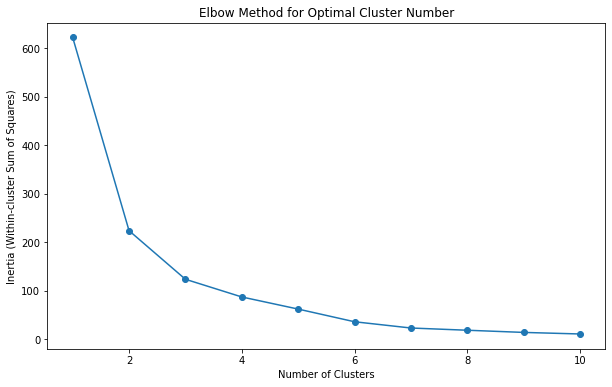

In [80]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(X_train)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [81]:
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_train)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [0 0 1 ... 2 0 0]


In [82]:
len(cluster_labels)

2706

In [66]:
train_model.shape

(2706, 1149)

In [85]:
app_train_encode = train_model.copy()

In [86]:
app_train_encode["SurgeryName"] = cluster_labels

In [87]:
app_train_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [88]:
sentences_test = [surgery.split() for surgery in surgery_names_test]


In [93]:
test_model.shape

(1207, 1149)

In [96]:
surgery_embeddings_test = []
for surgery in sentences_test:
    surgery_vector = np.mean([fasttext_model.wv[word] for word in surgery], axis=0)
    
    # Handle empty surgery vectors by replacing with zeros
    if surgery_vector.shape == ():
        surgery_vector = np.zeros((embedding_dim,))
        
    surgery_embeddings_test.append(surgery_vector)

X_test = np.vstack(surgery_embeddings_test)

In [97]:
X_test.shape

(1207, 100)

In [98]:
test_cluster_labels = kmeans.predict(X_test)

In [99]:
len(test_cluster_labels)

1207

In [100]:
test_cluster_labels

array([1, 1, 0, ..., 1, 0, 1])

In [102]:
test_model.head(1)

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [101]:
app_test_encode = test_model.copy()


In [103]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [104]:
app_train_encode.head()


,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [105]:
app_test_encode.head()

,SurgeryName,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combinat

In [106]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [107]:
app_train_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [108]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [109]:
app_test_encode_cluster.head()

,Age,ElapsedTime(second),SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Rejyonel Sinir Bloğu,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Service_1,Service_2,Service_3,Service_4,Service_5,Service_7,Service_8,Service_9,Service_10,Service_11,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,Sex_MALE,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Z,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-K,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-W,combination_first_3_S-Z,combination_first_3_Z,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_S-W,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_D-I,combination_first_5_E-K,combination_first_5_E-Z,combination_first_5_H-H,combination_first_5_H-J,combination_first_5_I-K,combination_first_5_I-M,combination_first_5_I-N,combination_first_5_I-Z,combination_first_5_J-J,combination_first_5_J-K,combination_first_5_J-L,combination_first_5_J-N,combination_first_5_J-R,combination_first_5_K-K,combination_first_5_K-L,combination_first_5_K-M,combination_first_5_K-N,combination_first_5_M-M,combination_first_5_M-R,combination_first_5_M-S,combination_first_5_N,combination_first_5_

In [110]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



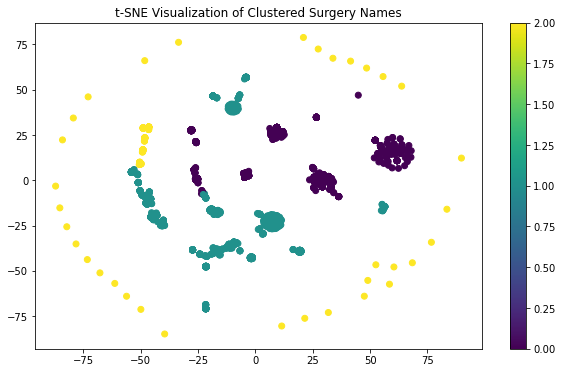

In [111]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [112]:
models = encode_test(app_train_encode_cluster)

Train shape: (2435, 1150) | Val Shape: (271, 1150)
[0]	validation_0-rmse:4307.88792	validation_1-rmse:3981.74904
[1]	validation_0-rmse:3344.29832	validation_1-rmse:3027.66058
[2]	validation_0-rmse:2732.39170	validation_1-rmse:2397.80110


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2351.92827	validation_1-rmse:1990.42510
[4]	validation_0-rmse:2115.47319	validation_1-rmse:1718.50029
[5]	validation_0-rmse:1993.08777	validation_1-rmse:1562.29032
[6]	validation_0-rmse:1922.25507	validation_1-rmse:1460.49797
[7]	validation_0-rmse:1879.94108	validation_1-rmse:1393.45845
[8]	validation_0-rmse:1866.39235	validation_1-rmse:1354.59619
[9]	validation_0-rmse:1846.85592	validation_1-rmse:1310.90208
[10]	validation_0-rmse:1823.72460	validation_1-rmse:1275.73275
[11]	validation_0-rmse:1820.08800	validation_1-rmse:1259.91748
[12]	validation_0-rmse:1817.41544	validation_1-rmse:1241.75124
[13]	validation_0-rmse:1812.66290	validation_1-rmse:1224.71955
[14]	validation_0-rmse:1806.82122	validation_1-rmse:1209.58814
[15]	validation_0-rmse:1803.10652	validation_1-rmse:1204.32669
[16]	validation_0-rmse:1803.42738	validation_1-rmse:1190.62055
[17]	validation_0-rmse:1802.40753	validation_1-rmse:1181.87110
[18]	validation_0-rmse:1804.68830	validation_1-rmse:1177.33356

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[4]	validation_0-rmse:2262.25480	validation_1-rmse:1697.39085
[5]	validation_0-rmse:2147.85609	validation_1-rmse:1530.71279
[6]	validation_0-rmse:2107.40386	validation_1-rmse:1426.61051
[7]	validation_0-rmse:2078.43223	validation_1-rmse:1355.46860
[8]	validation_0-rmse:2055.97647	validation_1-rmse:1305.14089
[9]	validation_0-rmse:2042.86149	validation_1-rmse:1274.21099
[10]	validation_0-rmse:2034.90173	validation_1-rmse:1242.91597
[11]	validation_0-rmse:2034.29149	validation_1-rmse:1226.79905
[12]	validation_0-rmse:2035.18335	validation_1-rmse:1217.65362
[13]	validation_0-rmse:2032.83779	validation_1-rmse:1198.34307
[14]	validation_0-rmse:2036.11420	validation_1-rmse:1188.09054
[15]	validation_0-rmse:2036.72231	validation_1-rmse:1179.16208
[16]	validation_0-rmse:2035.50969	validation_1-rmse:1160.03587
[17]	validation_0-rmse:2037.50431	validation_1-rmse:1143.40026
[18]	validation_0-rmse:2033.55951	validation_1-rmse:1134.59723
[19]	validation_0-rmse:2030.93216	validation_1-rmse:1130.3086

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2147.35415	validation_1-rmse:2013.13220
[4]	validation_0-rmse:1905.12722	validation_1-rmse:1759.67315
[5]	validation_0-rmse:1750.99824	validation_1-rmse:1585.88235
[6]	validation_0-rmse:1670.37792	validation_1-rmse:1494.20124
[7]	validation_0-rmse:1622.78700	validation_1-rmse:1420.73828
[8]	validation_0-rmse:1569.49800	validation_1-rmse:1362.72219
[9]	validation_0-rmse:1544.80584	validation_1-rmse:1326.91835
[10]	validation_0-rmse:1535.64637	validation_1-rmse:1307.44688
[11]	validation_0-rmse:1509.98023	validation_1-rmse:1283.74054
[12]	validation_0-rmse:1503.03755	validation_1-rmse:1273.39465
[13]	validation_0-rmse:1496.07522	validation_1-rmse:1252.74143
[14]	validation_0-rmse:1496.08794	validation_1-rmse:1240.04463
[15]	validation_0-rmse:1494.13105	validation_1-rmse:1231.09223
[16]	validation_0-rmse:1493.46153	validation_1-rmse:1223.15831
[17]	validation_0-rmse:1490.80726	validation_1-rmse:1216.59607
[18]	validation_0-rmse:1491.26890	validation_1-rmse:1201.79912

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2097.56926	validation_1-rmse:2012.76418
[4]	validation_0-rmse:1850.98316	validation_1-rmse:1754.02503
[5]	validation_0-rmse:1703.79612	validation_1-rmse:1593.68134
[6]	validation_0-rmse:1625.26744	validation_1-rmse:1492.71932
[7]	validation_0-rmse:1591.69758	validation_1-rmse:1426.63207
[8]	validation_0-rmse:1584.36988	validation_1-rmse:1388.41597
[9]	validation_0-rmse:1580.82645	validation_1-rmse:1354.36912
[10]	validation_0-rmse:1578.94724	validation_1-rmse:1340.12894
[11]	validation_0-rmse:1582.89124	validation_1-rmse:1316.48500
[12]	validation_0-rmse:1582.49880	validation_1-rmse:1299.32961
[13]	validation_0-rmse:1555.74431	validation_1-rmse:1273.85880
[14]	validation_0-rmse:1557.14271	validation_1-rmse:1265.36614
[15]	validation_0-rmse:1554.86480	validation_1-rmse:1252.03856
[16]	validation_0-rmse:1554.00850	validation_1-rmse:1243.99692
[17]	validation_0-rmse:1553.12270	validation_1-rmse:1236.61711
[18]	validation_0-rmse:1551.63561	validation_1-rmse:1220.83107

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1980.95799	validation_1-rmse:2014.02630
[4]	validation_0-rmse:1784.00549	validation_1-rmse:1744.97088
[5]	validation_0-rmse:1692.17326	validation_1-rmse:1579.33108
[6]	validation_0-rmse:1622.81029	validation_1-rmse:1476.07099
[7]	validation_0-rmse:1583.49369	validation_1-rmse:1407.47614
[8]	validation_0-rmse:1557.19619	validation_1-rmse:1357.92203
[9]	validation_0-rmse:1550.59809	validation_1-rmse:1329.63034
[10]	validation_0-rmse:1545.36328	validation_1-rmse:1292.22716
[11]	validation_0-rmse:1540.83545	validation_1-rmse:1268.85369
[12]	validation_0-rmse:1544.31566	validation_1-rmse:1260.68575
[13]	validation_0-rmse:1544.89576	validation_1-rmse:1234.97107
[14]	validation_0-rmse:1543.80763	validation_1-rmse:1226.63991
[15]	validation_0-rmse:1539.12883	validation_1-rmse:1216.46900
[16]	validation_0-rmse:1537.73849	validation_1-rmse:1206.31684
[17]	validation_0-rmse:1536.66467	validation_1-rmse:1201.44052
[18]	validation_0-rmse:1532.28684	validation_1-rmse:1191.29180

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1971.74164	validation_1-rmse:2006.52306
[4]	validation_0-rmse:1768.46758	validation_1-rmse:1747.33046
[5]	validation_0-rmse:1672.28696	validation_1-rmse:1575.16597
[6]	validation_0-rmse:1625.47767	validation_1-rmse:1481.69196
[7]	validation_0-rmse:1592.20894	validation_1-rmse:1401.12489
[8]	validation_0-rmse:1572.10950	validation_1-rmse:1358.23127
[9]	validation_0-rmse:1566.65032	validation_1-rmse:1314.04556
[10]	validation_0-rmse:1558.34842	validation_1-rmse:1283.56108
[11]	validation_0-rmse:1554.57593	validation_1-rmse:1267.16769
[12]	validation_0-rmse:1550.88129	validation_1-rmse:1256.62086
[13]	validation_0-rmse:1544.96448	validation_1-rmse:1248.96862
[14]	validation_0-rmse:1544.29482	validation_1-rmse:1234.04240
[15]	validation_0-rmse:1538.71482	validation_1-rmse:1224.23663
[16]	validation_0-rmse:1534.74089	validation_1-rmse:1215.76658
[17]	validation_0-rmse:1534.95248	validation_1-rmse:1209.88895
[18]	validation_0-rmse:1534.97999	validation_1-rmse:1205.08083

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2345.32419	validation_1-rmse:1966.23458
[4]	validation_0-rmse:2148.17427	validation_1-rmse:1709.45275
[5]	validation_0-rmse:2039.24051	validation_1-rmse:1537.65511
[6]	validation_0-rmse:1982.15208	validation_1-rmse:1442.42523
[7]	validation_0-rmse:1922.69399	validation_1-rmse:1364.25667
[8]	validation_0-rmse:1892.02259	validation_1-rmse:1317.08169
[9]	validation_0-rmse:1883.17650	validation_1-rmse:1281.85796
[10]	validation_0-rmse:1884.32661	validation_1-rmse:1258.00586
[11]	validation_0-rmse:1892.38025	validation_1-rmse:1239.18367
[12]	validation_0-rmse:1889.90177	validation_1-rmse:1215.54928
[13]	validation_0-rmse:1887.73271	validation_1-rmse:1199.88673
[14]	validation_0-rmse:1893.77317	validation_1-rmse:1184.10360
[15]	validation_0-rmse:1889.69028	validation_1-rmse:1178.28641
[16]	validation_0-rmse:1879.92672	validation_1-rmse:1173.02198
[17]	validation_0-rmse:1887.00088	validation_1-rmse:1162.90808
[18]	validation_0-rmse:1886.06534	validation_1-rmse:1157.54697

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:3669.82258	validation_1-rmse:4044.39167
[1]	validation_0-rmse:2806.36579	validation_1-rmse:3076.74133
[2]	validation_0-rmse:2263.78319	validation_1-rmse:2436.62545
[3]	validation_0-rmse:1900.26189	validation_1-rmse:2026.85163
[4]	validation_0-rmse:1702.02687	validation_1-rmse:1763.65667
[5]	validation_0-rmse:1570.98570	validation_1-rmse:1590.07799
[6]	validation_0-rmse:1494.70193	validation_1-rmse:1478.86274
[7]	validation_0-rmse:1459.12697	validation_1-rmse:1415.23603
[8]	validation_0-rmse:1431.19667	validation_1-rmse:1365.37328
[9]	validation_0-rmse:1410.96972	validation_1-rmse:1328.21843
[10]	validation_0-rmse:1397.59143	validation_1-rmse:1306.53039
[11]	validation_0-rmse:1392.76946	validation_1-rmse:1288.11438
[12]	validation_0-rmse:1389.86423	validation_1-rmse:1273.01882
[13]	validation_0-rmse:1379.91450	validation_1-rmse:1261.58556
[14]	validation_0-rmse:1374.22159	validation_1-rmse:1251.07462
[15]	validation_0-rmse:1374.25730	validation_1-rmse:1242.95229
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2505.05519	validation_1-rmse:2413.64922
[3]	validation_0-rmse:2087.72540	validation_1-rmse:1998.40248
[4]	validation_0-rmse:1847.39140	validation_1-rmse:1748.58468
[5]	validation_0-rmse:1722.56807	validation_1-rmse:1588.46638
[6]	validation_0-rmse:1624.62188	validation_1-rmse:1475.09218
[7]	validation_0-rmse:1578.75926	validation_1-rmse:1409.58599
[8]	validation_0-rmse:1552.32620	validation_1-rmse:1364.23300
[9]	validation_0-rmse:1540.06227	validation_1-rmse:1319.84198
[10]	validation_0-rmse:1532.94650	validation_1-rmse:1299.98831
[11]	validation_0-rmse:1521.84220	validation_1-rmse:1275.08507
[12]	validation_0-rmse:1515.10992	validation_1-rmse:1262.39414
[13]	validation_0-rmse:1515.05062	validation_1-rmse:1255.45066
[14]	validation_0-rmse:1515.63099	validation_1-rmse:1234.34395
[15]	validation_0-rmse:1519.09281	validation_1-rmse:1212.72152
[16]	validation_0-rmse:1517.71850	validation_1-rmse:1207.04136
[17]	validation_0-rmse:1512.66992	validation_1-rmse:1198.69198


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2343.00695	validation_1-rmse:2426.57788
[3]	validation_0-rmse:1967.36463	validation_1-rmse:2012.02738
[4]	validation_0-rmse:1754.43117	validation_1-rmse:1752.84743
[5]	validation_0-rmse:1632.35856	validation_1-rmse:1588.49756
[6]	validation_0-rmse:1535.57512	validation_1-rmse:1474.73744
[7]	validation_0-rmse:1494.97703	validation_1-rmse:1408.40908
[8]	validation_0-rmse:1473.19571	validation_1-rmse:1356.44481
[9]	validation_0-rmse:1460.45534	validation_1-rmse:1324.12520
[10]	validation_0-rmse:1470.56047	validation_1-rmse:1306.72297
[11]	validation_0-rmse:1463.29266	validation_1-rmse:1279.17507
[12]	validation_0-rmse:1460.30714	validation_1-rmse:1268.16585
[13]	validation_0-rmse:1452.25002	validation_1-rmse:1252.85294
[14]	validation_0-rmse:1455.34330	validation_1-rmse:1237.70450
[15]	validation_0-rmse:1455.82964	validation_1-rmse:1231.04499
[16]	validation_0-rmse:1461.58146	validation_1-rmse:1224.10508
[17]	validation_0-rmse:1464.29454	validation_1-rmse:1212.23666


### Encode with fasttext embeddings then kmeans-3 cluster

In [113]:
encode_submission(app_test_encode_cluster, models)

RMSE: 1347.7165044269836
R^2: 0.803733325624618
Adjusted R-squared: 0.8035704487164226


## Encoding with Global-Vectors